## Installing and Importing Dependencies

In [ ]:
!pip install openai
!pip install pyspellchecker
!pip install python-Levenshtein
!pip install spacy
!pip install sentence_transformers
!pip install tensorflow_hub
!pip install wordcloud
!python -m spacy download en_core_web_md
!pip install pandas langdetect

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.8/42.8 MB 15.6 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_md')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
import pandas as pd
import numpy as np
import re
import string
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from bs4 import BeautifulSoup
from openai import OpenAI
import os
from spellchecker import SpellChecker
import matplotlib.pyplot as plt
from Levenshtein import distance as lev_distance
from collections import Counter
import spacy
from sentence_transformers import SentenceTransformer, util
import tensorflow_hub as hub
from scipy.spatial import distance
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import cosine
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from wordcloud import WordCloud
from langdetect import detect, DetectorFactory, LangDetectException
from langdetect.lang_detect_exception import LangDetectException

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Set your OpenAI API key as an environment variable
os.environ["OPENAI_API_KEY"] = " "


/usr/local/lib/python3.10/dist-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Read the Dataset

In [ ]:
data = pd.read_csv("besluitenlijsten.csv")

# Load Dutch word list
with open("dutch_wordlist.txt", "r", encoding="utf-8") as file:
    dictionary = set(word.strip().lower() for word in file.readlines())

#data = data[:10]

In [ ]:
data

,Unnamed: 0.1,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,pdftotext,...,foi_contourArea,foi_textArea,foi_charArea,foi_percentageTextAreaRedacted,foi_percentageCharAreaRedacted,foi_nrWords,foi_nrChars,foi_nrWordsOCR,foi_nrCharsOCR,updated_pdftotext
0,nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,NaN,...,123836.0,4145804.0,1391804.0,2.99,8.90,0,0,352,2117,
1,nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,NaN,...,103318.5,3901992.0,1245717.5,2.65,8.29,0,0,320,1694,
2,nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,NaN,...,219293.0,4959038.0,1087913.0,4.42,20.16,0,0,243,1291,
3,nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,NaN,...,105980.0,4974156.0,1271474.0,2.13,8.34,0,0,323,1773,
4,nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,NaN,...,134818.5,5010320.0,1410540.5,2.69,9.56,0,0,358,2085,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3548,nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,\n\n\n\n ...,...,117715.0,4830046.0,1168080.0,2.44,10.08,300,1646,299,1647,...
3549,nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,\n\n\n\n\n\n\n\n\n\n\n >Retouradres ...,...,151084.0,5349360.0,1268003.0,2.82,11.92,340,1822,346,1867,> Retouradres Postbus 20401 2500 EK Den Haag\n...
3550,nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,\n\n\n\n\n\n\n ...,...,0.0,3315224.0,1082371.0,0.00,0.00,342,1884,349,1900,...
3551,nl.mnre1018.2i.2023.14.doc.1,74859,1116305,Ministerie Van Defensie,mnre1018,NaN,2023-03-28,2023,1,\n\n\n\n\n ...,...,1617.5,6077008.0,1257470.5,0.03,0.13,330,2021,338,2024,...


In [ ]:
nan_count = data['tesseract'].isna().sum()
print(f'Count of NaN values in the Cleaned text column: {nan_count}')

Count of NaN values in the Cleaned text column: 1


## Preprocessing

In [ ]:
data.rename({'foi_bodyText': 'pdftotext', 'foi_bodyTextOCR': 'tesseract', 'Unnamed: 0.1': 'foi_documentId'}, axis=1, inplace=True)
data = data.set_index('foi_documentId')

In [ ]:
data

,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,pdftotext,tesseract,...,foi_contourArea,foi_textArea,foi_charArea,foi_percentageTextAreaRedacted,foi_percentageCharAreaRedacted,foi_nrWords,foi_nrChars,foi_nrWordsOCR,foi_nrCharsOCR,updated_pdftotext
foi_documentId,,,,,,,,,,,,,,,,,,,,,
nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,NaN,Kabinet Minister-President Ministerie van...,...,123836.0,4145804.0,1391804.0,2.99,8.90,0,0,352,2117,
nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,NaN,RN Kabinet Minister-President RARE Minist...,...,103318.5,3901992.0,1245717.5,2.65,8.29,0,0,320,1694,
nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,NaN,Kabinet Minister-President Ministerie van...,...,219293.0,4959038.0,1087913.0,4.42,20.16,0,0,243,1291,
nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,NaN,ME Kabinet Minister-President ES4EM Minis...,...,105980.0,4974156.0,1271474.0,2.13,8.34,0,0,323,1773,
nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,NaN,Kabinet Minister-President Ministerie van...,...,134818.5,5010320.0,1410540.5,2.69,9.56,0,0,358,2085,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,\n\n\n\n ...,Kabinet Minister-President Ministerie van...,...,117715.0,4830046.0,1168080.0,2.44,10.08,300,1646,299,1647,...
nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,\n\n\n\n\n\n\n\n\n\n\n >Retouradres ...,"Ministerie van Landbouw, Natuur en Voedse...",...,151084.0,5349360.0,1268003.0,2.82,11.92,340,1822,346,1867,> Retouradres Postbus 20401 2500 EK Den Haag\n...
nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,\n\n\n\n\n\n\n ...,"Ministerie van Onderwijs, Cultuur en Wete...",...,0.0,3315224.0,1082371.0,0.00,0.00,342,1884,349,1900,...


In [ ]:
# Function to remove URLs from text
def remove_urls(text):
    return re.sub(r'http\S+', '', text)

# Function to remove HTML tags from text
def remove_html_tags(text):
    return BeautifulSoup(text, 'html.parser').get_text()

def preprocess_text(text):
    if isinstance(text, str):
        # Remove URLs
        text = remove_urls(text)
        # Remove HTML tags
        text = remove_html_tags(text)
        # Remove leading and trailing whitespace
        text = text.strip()
        # Convert text to lowercase
        text = text.lower()
        # Replace periods with a placeholder
        text = text.replace('.', 'FULLSTOPPLACEHOLDER')
        # Remove special characters and punctuation (except full stop)
        text = re.sub(r'[^\w\s.]', '', text)
        # Remove numbers
        text = re.sub(r'\d+', '', text)
        # Remove extra whitespace
        text = re.sub(r'\s+', ' ', text)
        # Find the position of the subject or a unique identifier
        subject_position = text.find("betreft")
        # Extract text after the subject position
        if subject_position != -1:
            text = text[subject_position + len("betreft"):]
            # Replace back the full stops
            text = text.replace('FULLSTOPPLACEHOLDER', '.')
            return text.strip()
        else:
            return ""  # Return an empty string if "betreft" is not found
    else:
        return ""

# Create a new column 'cleaned_text' to store the cleaned text
data['cleaned_text'] = data['tesseract'].apply(preprocess_text)

# Print the first few rows of the DataFrame with the new column
print(data['cleaned_text'])

<ipython-input-9-5608894efb72>:7: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  return BeautifulSoup(text, 'html.parser').get_text()


foi_documentId
nl.mnre1010.2i.2020.21.misc.1    wobbesluit inzake maatregelen corona covid gea...
nl.mnre1010.2i.2020.22.misc.1    wobbesluit vakantie griekenland koning geachte...
nl.mnre1010.2i.2020.23.misc.1    wobbesluit overzicht websites rijksoverheid ge...
nl.mnre1010.2i.2020.25.misc.1    contacten tussen nederlandse overheid en reger...
nl.mnre1010.2i.2020.26.misc.1    wobbesluit coronamaatregelen en geachte bij br...
                                                       ...                        
nl.mnre1010.2i.2023.3.doc.1      besluit op uw wooverzoek geachte bij email van...
nl.mnre1153.2i.2023.100.doc.1    deelbesluit b op uw verzoek d.d. maart over he...
nl.mnre1109.2i.2023.17.doc.1     beslissing wooverzoek bezwaar als u belang heb...
nl.mnre1018.2i.2023.14.doc.1     besluit op uw wooverzoek geachte op augustus h...
nl.mnre1153.2i.2023.101.doc.1    beslissing op verzoek woo uw referentie bijlag...
Name: cleaned_text, Length: 3553, dtype: object


In [ ]:
nan_count = data['cleaned_text'].isna().sum()
print(f'Count of NaN values in the Cleaned text column: {nan_count}')

Count of NaN values in the Cleaned text column: 0


In [ ]:
# Ensure consistent results from langdetect
DetectorFactory.seed = 0

# Function to detect language with additional checks
def detect_language(text):
    try:
        return detect(text)
    except LangDetectException:
        return 'unknown'

# Apply the function to the tesseract column
data['cleanedtext_language'] = data['cleaned_text'].apply(detect_language)
#data['repaired_language'] = data['repaired_text'].apply(detect_language)

# Check the language distribution
print(data['cleanedtext_language'].value_counts())
#print(data['repaired_language'].value_counts())

# Drop rows where the detected language is English (en) or Unknown
#data = data[~data['cleaned_language'].isin(['en', 'unknown'])]
#data = data[~data['repaired_language'].isin(['en', 'unknown'])]

# Drop the temporary language column
#data = data.drop(columns=['cleaned_language'])
#data = data.drop(columns=['repaired_language'])

cleanedtext_language
nl         2893
unknown     658
en            1
af            1
Name: count, dtype: int64


In [ ]:
data

,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,pdftotext,tesseract,...,foi_charArea,foi_percentageTextAreaRedacted,foi_percentageCharAreaRedacted,foi_nrWords,foi_nrChars,foi_nrWordsOCR,foi_nrCharsOCR,updated_pdftotext,cleaned_text,cleanedtext_language
foi_documentId,,,,,,,,,,,,,,,,,,,,,
nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,NaN,Kabinet Minister-President Ministerie van...,...,1391804.0,2.99,8.90,0,0,352,2117,,wobbesluit inzake maatregelen corona covid gea...,nl
nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,NaN,RN Kabinet Minister-President RARE Minist...,...,1245717.5,2.65,8.29,0,0,320,1694,,wobbesluit vakantie griekenland koning geachte...,nl
nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,NaN,Kabinet Minister-President Ministerie van...,...,1087913.0,4.42,20.16,0,0,243,1291,,wobbesluit overzicht websites rijksoverheid ge...,nl
nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,NaN,ME Kabinet Minister-President ES4EM Minis...,...,1271474.0,2.13,8.34,0,0,323,1773,,contacten tussen nederlandse overheid en reger...,nl
nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,NaN,Kabinet Minister-President Ministerie van...,...,1410540.5,2.69,9.56,0,0,358,2085,,wobbesluit coronamaatregelen en geachte bij br...,nl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,\n\n\n\n ...,Kabinet Minister-President Ministerie van...,...,1168080.0,2.44,10.08,300,1646,299,1647,...,besluit op uw wooverzoek geachte bij email van...,nl
nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,\n\n\n\n\n\n\n\n\n\n\n >Retouradres ...,"Ministerie van Landbouw, Natuur en Voedse...",...,1268003.0,2.82,11.92,340,1822,346,1867,> Retouradres Postbus 20401 2500 EK Den Haag\n...,deelbesluit b op uw verzoek d.d. maart over he...,nl
nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,\n\n\n\n\n\n\n ...,"Ministerie van Onderwijs, Cultuur en Wete...",...,1082371.0,0.00,0.00,342,1884,349,1900,...,beslissing wooverzoek bezwaar als u belang heb...,nl


In [ ]:
data['tesseract'][0]

"    Kabinet Minister-President  Ministerie van Algemene Zaken         > Retouradres Postbus 20001 2500 EA Den Haag    Kabinet Minister-President    Binnenhof 19   2513 AA Den Haag  Postbus 20001   2500 EA Den Haag  www.rijksoverheid.nl         Contactpersoon  WOB@minaz, nl    Onze referentie  4148019    Datum 7 oktober 2020  Betreft Wob-besluit inzake maatregelen corona (COVID-19)    Geachte    Bij brief van 26 maart 2020 en in aanvulling hierop bij brief van 11 juni 2020  heeft u bij het ministerie van Algemene Zaken, namens de Volkskrant, verzoeken  op grond van de Wet openbaarheid van bestuur (hierna: Wob) ingediend.    U geeft aan graag meer inzicht te krijgen in de weken in aanloop naar de  maatregelen die de regering maandagavond 24 maart 2020 aankondigde om  verdere verspreiding van het coronavirus (Covid-19) te voorkomen.    U verzoekt om openbaarmaking van hieronder nader gespecificeerde informatie:  ‘1. Kopie van, subsidiair inzage In, documenten en communicatie bij of onder

In [ ]:
data['cleaned_text'][0]

'wobbesluit inzake maatregelen corona covid geachte bij brief van maart en in aanvulling hierop bij brief van juni heeft u bij het ministerie van algemene zaken namens de volkskrant verzoeken op grond van de wet openbaarheid van bestuur hierna wob ingediend. u geeft aan graag meer inzicht te krijgen in de weken in aanloop naar de maatregelen die de regering maandagavond maart aankondigde om verdere verspreiding van het coronavirus covid te voorkomen. u verzoekt om openbaarmaking van hieronder nader gespecificeerde informatie . kopie van subsidiair inzage in documenten en communicatie bij of onder u aanwezig inzake het coronavirus covid voor het tijdvak december tot en met heden. met het coronavirus wordt onder meer bedoeld scenarios over de omvang en verspreiding van het virus impactanalyses te nemen maatregelen om verspreiding van het virus te voorkomen maatregelen om de capaciteit van de ziekenhuiszorg bij een uitbraak in nederland te vergroten tekorten aan medische middelen voor het

In [ ]:
data

,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,pdftotext,tesseract,...,foi_charArea,foi_percentageTextAreaRedacted,foi_percentageCharAreaRedacted,foi_nrWords,foi_nrChars,foi_nrWordsOCR,foi_nrCharsOCR,updated_pdftotext,cleaned_text,cleanedtext_language
foi_documentId,,,,,,,,,,,,,,,,,,,,,
nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,NaN,Kabinet Minister-President Ministerie van...,...,1391804.0,2.99,8.90,0,0,352,2117,,wobbesluit inzake maatregelen corona covid gea...,nl
nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,NaN,RN Kabinet Minister-President RARE Minist...,...,1245717.5,2.65,8.29,0,0,320,1694,,wobbesluit vakantie griekenland koning geachte...,nl
nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,NaN,Kabinet Minister-President Ministerie van...,...,1087913.0,4.42,20.16,0,0,243,1291,,wobbesluit overzicht websites rijksoverheid ge...,nl
nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,NaN,ME Kabinet Minister-President ES4EM Minis...,...,1271474.0,2.13,8.34,0,0,323,1773,,contacten tussen nederlandse overheid en reger...,nl
nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,NaN,Kabinet Minister-President Ministerie van...,...,1410540.5,2.69,9.56,0,0,358,2085,,wobbesluit coronamaatregelen en geachte bij br...,nl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,\n\n\n\n ...,Kabinet Minister-President Ministerie van...,...,1168080.0,2.44,10.08,300,1646,299,1647,...,besluit op uw wooverzoek geachte bij email van...,nl
nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,\n\n\n\n\n\n\n\n\n\n\n >Retouradres ...,"Ministerie van Landbouw, Natuur en Voedse...",...,1268003.0,2.82,11.92,340,1822,346,1867,> Retouradres Postbus 20401 2500 EK Den Haag\n...,deelbesluit b op uw verzoek d.d. maart over he...,nl
nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,\n\n\n\n\n\n\n ...,"Ministerie van Onderwijs, Cultuur en Wete...",...,1082371.0,0.00,0.00,342,1884,349,1900,...,beslissing wooverzoek bezwaar als u belang heb...,nl


## Reparation of Tesseract Column

In [ ]:
# Iterate over the rows and identify misspelled words
for index, row in data.iterrows():
    text = row["cleaned_text"]  # Assuming "tesseract" is the column containing the text
    sentences = text.split(".")
    misspelled_sentences = []
    for sentence in sentences:
        # Check each word in the sentence against the dictionary
        words = sentence.split()
        for word in words:
            if word.lower() not in dictionary:
                misspelled_sentences.append(sentence)
                break

In [ ]:
# Create a dictionary to store misspelled sentences and their positions for each document
misspelled_sentences_dict = {}
misspelled_words_list=[]
# Iterate over the rows and identify misspelled words
for index, row in data.iterrows():
    document_id = index  # Assuming the index is the document identifier
    text = row["cleaned_text"]  # Assuming "tesseract" is the column containing the text
    sentences = text.split(".")
    misspelled_sentences = []
    for i, sentence in enumerate(sentences):
        # Check each word in the sentence against the dictionary
        words = sentence.split()
        for word in words:
            if word.lower() not in dictionary:
                misspelled_words_list.append(word)
                misspelled_sentences.append((i, sentence))  # Store position and sentence
                break
    # Store misspelled sentences in the dictionary
    misspelled_sentences_dict[document_id] = misspelled_sentences

# Print the misspelled sentences and their positions for each document
for document_id, sentences in misspelled_sentences_dict.items():
    print(f"Document ID: {document_id}")
    for position, sentence in sentences:
        print(f"Position: {position}, Sentence: {sentence}")
    print()


Streaminguitvoer ingekort tot de laatste 5000 regels.

Document ID: nl.mnre1090.2i.2022.108.misc.1
Position: 0, Sentence: tweede deelbesluit inzake uw wobverzoek over de aanbevelingen en regelgeving met betrekking op cryptodienstverlening geachte in uw verzoek van februari ontvangen op dezelfde datum heeft u mij gevraagd informatie openbaar te maken over kort samengevat de aanbevelingen van de financial action task force hierna fatf de wet ter voorkoming van witwassen en financieren van terrorisme hierna wwft en de sanctiewet voor deze betrekking hebben op cryptodienstverlening
Position: 13, Sentence:  om u behulpzaam te zijn heb ik in de inventarislijst zowel de toepasselijke wob als woogronden opgenomen

Document ID: nl.mnre1090.2i.2022.94.misc.1
Position: 0, Sentence: besluit op uw wobverzoek inzake fmo en phcferonia a
Position: 4, Sentence:  openbaar te maken documenten geachte in uw brief van januari door mij ontvangen op februari heeft u het ministerie van financién gevraagd info

In [ ]:
print(misspelled_words_list)

['covid', 'covid', 'covid', 'scenarios', 'dgs', 'videobijeenkomsten', 'outbreak', 'heermevrouw', 'redeneerlijnen', 'sidn', 'nl', 'nl', 'nl', 'ministerpresident', 'dr', 'poelgeest', 'spreekpunten', 'johannessen', 'wobbestuiten', 'covid', 'covid', 'scenarios', 'agendaafspraken', 'dgs', 'videobijeenkomsten', 'outbreak', 'bkb', 'bkb', 'minicompetitie', 'ezklnv', 'vergaderingenbesprekingen', 'persoonlijkeambtelijke', 'world', 'ministerpresident', 'nl', 'redeneerlijnen', 'ministerpresident', 'middennederland', 'steunmaatregelenpakket', 'hiernawob', 'vitdrukkelijk', 'geappt', 'enof', 'aanta', 'aanvraagwietteelt', 'nl', 'aanvraagwietteelt', 'nl', 'aanvraagwietteelt', 'nl', 'jl', 'plugin', 'plugin', 'featuresenterpriseformsenterpriseforms', 'htmi', 'enterprise', 'minsterraad', 'agendas', 'ministerpresident', 'nl', 'tm', 'onderraden', 'onderraden', 'ì', 'kinderopvangtoeslagaffaire', 'mediastrategieën', 'awb', 'guldenpostzegel', 'guldenpostzegels', 'guldenpostzegel', 'econonnische', 'cemc', 'mini

In [ ]:
misspelled_sentences_dict

{'nl.mnre1010.2i.2020.21.misc.1': [(0,
   'wobbesluit inzake maatregelen corona covid geachte bij brief van maart en in aanvulling hierop bij brief van juni heeft u bij het ministerie van algemene zaken namens de volkskrant verzoeken op grond van de wet openbaarheid van bestuur hierna wob ingediend'),
  (1,
   ' u geeft aan graag meer inzicht te krijgen in de weken in aanloop naar de maatregelen die de regering maandagavond maart aankondigde om verdere verspreiding van het coronavirus covid te voorkomen'),
  (3,
   ' kopie van subsidiair inzage in documenten en communicatie bij of onder u aanwezig inzake het coronavirus covid voor het tijdvak december tot en met heden'),
  (4,
   ' met het coronavirus wordt onder meer bedoeld scenarios over de omvang en verspreiding van het virus impactanalyses te nemen maatregelen om verspreiding van het virus te voorkomen maatregelen om de capaciteit van de ziekenhuiszorg bij een uitbraak in nederland te vergroten tekorten aan medische middelen voor 

In [ ]:
client = OpenAI(api_key=os.environ["OPENAI_API_KEY"])

def correct_text(sentence):
    prompt = f"e krijgt de taak om de zinnen van overheidsdocumenten te verbeteren.\
    Houd er rekening mee dat de tekst over Nederlandse besluitvormingen gaat.\
    Verbeter de fout gespelde woorden in deze zin, geef de goed gespelde zin terug.\
    De fouten komen door dat de gescande documenten zijn vertaald met OCR (optical character recognition).\
    Het kan voorkomen dat er een spatie mist, doordat woorden zijn samengevoegd door OCR, alleen dan mag je een spatie toevoegen. Laat de goedgespelde woorden in de zin hetzelfde.\
    Laat kleine letters zoals ze zijn, en hoofdletters zoals ze zijn.\
    Verbeter alleen de foutgespelde woorden, verander verder niets aan de zin. Voeg ook geen woorden toe.\
    Als er geen fouten zijn, geef dan dezelfde zin terug zonder er iets bij te zeggen.\:\n{sentence}\n\nCorrected sentence:"
    completion = client.chat.completions.create(
        model="gpt-4o",
        messages=[{"role": "user", "content": prompt}],
        max_tokens=4096,
        temperature=0.7,
        n=1
    )
    corrected_sentence = completion.choices[0].message.content
    #print(completion.choices[0].message)
    return corrected_sentence


# DO NOT RUN THE 2 CELLS BELOW SINCE THEY'RE USED FOR REPARATION

In [ ]:

data["repaired_text"] = ""
# Iterate over the misspelled sentences and their positions for each document
for document_id, sentences in misspelled_sentences_dict.items():
    repaired_text = data.at[document_id, "cleaned_text"]  # Get the original text

    # Iterate over each misspelled sentence
    for position, sentence in sentences:
        # Print the unrepaired sentence
        print("Original Sentence:", sentence)

        # Send the misspelled sentence to the ChatGPT API for correction
        corrected_sentence = correct_text(sentence)

        # Print the repaired sentence
        print("Repaired Sentence:", corrected_sentence)
        print()  # Add a blank line for readability

        # Replace the misspelled sentence with the corrected one in the original text
        sentences_list = repaired_text.split(".")
        sentences_list[position] = corrected_sentence
        repaired_text = ".".join(sentences_list)

    # Store the repaired text in the DataFrame
    data.at[document_id, "repaired_text"] = repaired_text
    data.to_csv('ContinuousProgress.csv')

# Print the first few rows of the DataFrame with the repaired text
print(data.head())


In [ ]:
 data
 data.to_csv('DataAfterRepair.csv')


## START RUNNING FROM HERE - Post Reparation

In [ ]:
data = pd.read_csv("DataAfterRepair.csv")
data = data.drop(['corrected_text'], axis=1)

In [ ]:
nan_count = data['repaired_text'].isna().sum()
print(f'Count of NaN values in the Cleaned text column: {nan_count}')

Count of NaN values in the Cleaned text column: 658


In [ ]:
# Drop the rows where 'repaired_text' column has NaN values
data = data.dropna(subset=['repaired_text'])

In [ ]:
data

,foi_documentId,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,pdftotext,...,foi_charArea,foi_percentageTextAreaRedacted,foi_percentageCharAreaRedacted,foi_nrWords,foi_nrChars,foi_nrWordsOCR,foi_nrCharsOCR,updated_pdftotext,cleaned_text,repaired_text
0,nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,NaN,...,1391804.0,2.99,8.90,0,0,352,2117,,wobbesluit inzake maatregelen corona covid gea...,wob-besluit inzake maatregelen corona covid ge...
1,nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,NaN,...,1245717.5,2.65,8.29,0,0,320,1694,,wobbesluit vakantie griekenland koning geachte...,wobbesluit vakantie griekenland koning geachte...
2,nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,NaN,...,1087913.0,4.42,20.16,0,0,243,1291,,wobbesluit overzicht websites rijksoverheid ge...,wobbesluit overzicht websites rijksoverheid ge...
3,nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,NaN,...,1271474.0,2.13,8.34,0,0,323,1773,,contacten tussen nederlandse overheid en reger...,contacten tussen nederlandse overheid en reger...
4,nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,NaN,...,1410540.5,2.69,9.56,0,0,358,2085,,wobbesluit coronamaatregelen en geachte bij br...,wobbesluit coronamaatregelen en geachte bij br...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3548,nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,\n\n\n\n ...,...,1168080.0,2.44,10.08,300,1646,299,1647,...,besluit op uw wooverzoek geachte bij email van...,besluit op uw verzoek geachte bij email van se...
3549,nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,\n\n\n\n\n\n\n\n\n\n\n >Retouradres ...,...,1268003.0,2.82,11.92,340,1822,346,1867,> Retouradres Postbus 20401 2500 EK Den Haag\n...,deelbesluit b op uw verzoek d.d. maart over he...,deelbesluit b op uw verzoek d.d.maart over het...
3550,nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,\n\n\n\n\n\n\n ...,...,1082371.0,0.00,0.00,342,1884,349,1900,...,beslissing wooverzoek bezwaar als u belang heb...,beslissing wooverzoek bezwaar als u belang heb...
3551,nl.mnre1018.2i.2023.14.doc.1,74859,1116305,Ministerie Van Defensie,mnre1018,NaN,2023-03-28,2023,1,\n\n\n\n\n ...,...,1257470.5,0.03,0.13,330,2021,338,2024,...,besluit op uw wooverzoek geachte op augustus h...,besluit op uw wooverzoek geachte op augustus h...


In [ ]:
string1=data['tesseract'][0]
print(string1)
count=len(string1.split())
count

    Kabinet Minister-President  Ministerie van Algemene Zaken         > Retouradres Postbus 20001 2500 EA Den Haag    Kabinet Minister-President    Binnenhof 19   2513 AA Den Haag  Postbus 20001   2500 EA Den Haag  www.rijksoverheid.nl         Contactpersoon  WOB@minaz, nl    Onze referentie  4148019    Datum 7 oktober 2020  Betreft Wob-besluit inzake maatregelen corona (COVID-19)    Geachte    Bij brief van 26 maart 2020 en in aanvulling hierop bij brief van 11 juni 2020  heeft u bij het ministerie van Algemene Zaken, namens de Volkskrant, verzoeken  op grond van de Wet openbaarheid van bestuur (hierna: Wob) ingediend.    U geeft aan graag meer inzicht te krijgen in de weken in aanloop naar de  maatregelen die de regering maandagavond 24 maart 2020 aankondigde om  verdere verspreiding van het coronavirus (Covid-19) te voorkomen.    U verzoekt om openbaarmaking van hieronder nader gespecificeerde informatie:  ‘1. Kopie van, subsidiair inzage In, documenten en communicatie bij of onder 

353

In [ ]:
string2=data['cleaned_text'][0]
print(string2)
count2=len(string2.split())
count2

wobbesluit inzake maatregelen corona covid geachte bij brief van maart en in aanvulling hierop bij brief van juni heeft u bij het ministerie van algemene zaken namens de volkskrant verzoeken op grond van de wet openbaarheid van bestuur hierna wob ingediend. u geeft aan graag meer inzicht te krijgen in de weken in aanloop naar de maatregelen die de regering maandagavond maart aankondigde om verdere verspreiding van het coronavirus covid te voorkomen. u verzoekt om openbaarmaking van hieronder nader gespecificeerde informatie . kopie van subsidiair inzage in documenten en communicatie bij of onder u aanwezig inzake het coronavirus covid voor het tijdvak december tot en met heden. met het coronavirus wordt onder meer bedoeld scenarios over de omvang en verspreiding van het virus impactanalyses te nemen maatregelen om verspreiding van het virus te voorkomen maatregelen om de capaciteit van de ziekenhuiszorg bij een uitbraak in nederland te vergroten tekorten aan medische middelen voor het 

303

In [ ]:
string3=data['repaired_text'][0]
print(string3)
count3=len(string3.split())
count3

wob-besluit inzake maatregelen corona covid geachte bij brief van maart en in aanvulling hierop bij brief van juni heeft u bij het ministerie van algemene zaken namens de volkskrant verzoeken op grond van de wet openbaarheid van bestuur hierna wob ingediend.u geeft aan graag meer inzicht te krijgen in de weken in aanloop naar de maatregelen die de regering maandagavond maart aankondigde om verdere verspreiding van het coronavirus COVID-19 te voorkomen. u verzoekt om openbaarmaking van hieronder nader gespecificeerde informatie .kopie van subsidiair inzage in documenten en communicatie bij of onder u aanwezig inzake het coronavirus covid voor het tijdvak december tot en met heden.met het coronavirus wordt onder meer bedoeld scenario's over de omvang en verspreiding van het virus impactanalyses te nemen maatregelen om verspreiding van het virus te voorkomen maatregelen om de capaciteit van de ziekenhuiszorg bij een uitbraak in nederland te vergroten tekorten aan medische middelen voor he

295

In [ ]:
string1=data['tesseract'][1]
print(string1)
count=len(string1.split())
count

    RN Kabinet Minister-President  RARE Ministerie van Algemene Zaken         > Retouradres Postbus 20001 2500 EA Den Haag    Kabinet Minister-President    Binnenhof 19   2513 AA Den Haag  Postbus 20001   2500 EA Den Haag  www.rijksoverheid.nl         Contactpersoon  WOB@minaz.nl    Onze referentie  4161286    Datum 16 november 2020  Betreft Wob-besluit vakantie Griekenland Koning    Geachte heer/mevrouw    Bij brief van 19 oktober 2020, ontvangen op 20 oktober 2020, heeft u bij het  ministerie van Algemene Zaken een verzoek op grond van de Wet openbaarheid  van bestuur (Wob) ingediend.    U heeft uw verzoek al volgt geformuleerd:   ‘Ik zal nu nader specificeren waar ik om verzoek, in relatie tot de voorgenomen  vakantie van Z.M. de Koning naar Griekenland op vrijdag 16 oktober j.l. en zijn  terugkeer.   e correspondentie over de voorgenomen vakantie van Z.M. de Koning, het vertrek  van Z.M. de Koning en zijn terugkeer tussen u en uw ministerie en andere  ministeries   e correspondenti

333

In [ ]:
string2=data['cleaned_text'][1]
print(string2)
count2=len(string2.split())
count2

wobbesluit vakantie griekenland koning geachte heermevrouw bij brief van oktober ontvangen op oktober heeft u bij het ministerie van algemene zaken een verzoek op grond van de wet openbaarheid van bestuur wob ingediend. u heeft uw verzoek al volgt geformuleerd ik zal nu nader specificeren waar ik om verzoek in relatie tot de voorgenomen vakantie van z.m. de koning naar griekenland op vrijdag oktober j.l. en zijn terugkeer. e correspondentie over de voorgenomen vakantie van z.m. de koning het vertrek van z.m. de koning en zijn terugkeer tussen u en uw ministerie en andere ministeries e correspondentie over de voorgenomen vakantie van z.m. de koning het vertrek van z.m. de koning en zijn terugkeer tussen u en uw ministerie en de rijksvoorlichtingsdienst rvd documenten omtrent de voorgenomen vakantie van z.m. de koning en zijn vertrek ten bate van de wekelijkse persconferentie na de ministerraad op vrijdag op oktober waaronder briefings redeneerlijnen qas notulen memos etc. het tijdsbeste

277

In [ ]:
string3=data['repaired_text'][1]
print(string3)
count3=len(string3.split())
count3

wobbesluit vakantie griekenland koning geachte heer/mevrouw bij brief van oktober ontvangen op oktober heeft u bij het ministerie van algemene zaken een verzoek op grond van de wet openbaarheid van bestuur Wob ingediend. u heeft uw verzoek al volgt geformuleerd ik zal nu nader specificeren waar ik om verzoek in relatie tot de voorgenomen vakantie van z.m. de koning naar griekenland op vrijdag oktober j.l. en zijn terugkeer. e correspondentie over de voorgenomen vakantie van z.m. de koning het vertrek van z.m. de koning en zijn terugkeer tussen u en uw ministerie en andere ministeries e correspondentie over de voorgenomen vakantie van z.m. de koning het vertrek van z.m. de koning en zijn terugkeer tussen u en uw ministerie en de rijksvoorlichtingsdienst rvd documenten omtrent de voorgenomen vakantie van z.m.de koning en zijn vertrek ten bate van de wekelijkse persconferentie na de ministerraad op vrijdag op oktober waaronder briefings redeneerlijnen was notulen memo's etc. het tijdsbest

276

## Data Analysis and Metrics

In [ ]:
# Convert all columns to string
data['tesseract'] = data['tesseract'].astype(str)
data['cleaned_text'] = data['cleaned_text'].astype(str)
data['repaired_text'] = data['repaired_text'].astype(str)

In [ ]:
# Calculate word counts
data['tesseract_word_count'] = data['tesseract'].apply(lambda x: len(x.split()))
data['cleaned_word_count'] = data['cleaned_text'].apply(lambda x: len(x.split()))
data['repaired_word_count'] = data['repaired_text'].apply(lambda x: len(x.split()))

<ipython-input-33-5a62fa5c43d8>:9: UserWarning: The palette list has more values (10) than needed (3), which may not be intended.
  sns.displot(data=data_melted, x='Nr of words', hue='Type', kind='kde', fill=True, palette=palette)


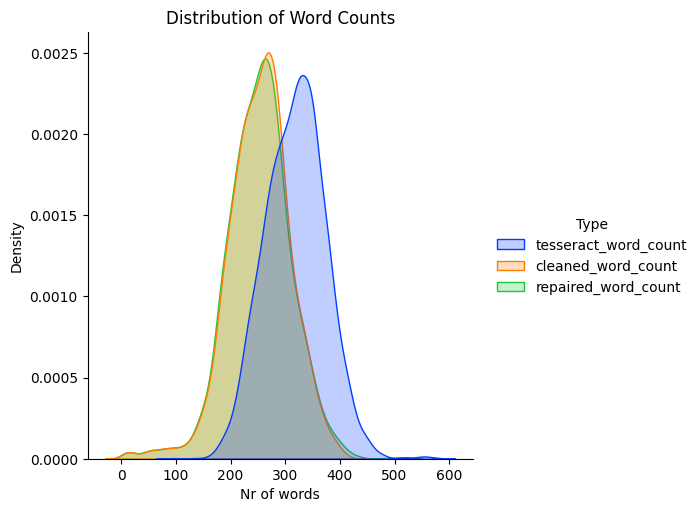

In [ ]:
# Melt the DataFrame to have a suitable format for seaborn
data_melted = data.melt(value_vars=['tesseract_word_count', 'cleaned_word_count', 'repaired_word_count'],
                        var_name='Type', value_name='Nr of words')

# Define a custom color palette
palette = sns.color_palette("bright")

# Plot the displot with the custom palette
sns.displot(data=data_melted, x='Nr of words', hue='Type', kind='kde', fill=True, palette=palette)

# Add titles and labels
plt.title('Distribution of Word Counts')
plt.xlabel('Nr of words')
plt.ylabel('Density')

# Show the plot
plt.show()

In [ ]:
data

,foi_documentId,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,pdftotext,...,foi_nrWords,foi_nrChars,foi_nrWordsOCR,foi_nrCharsOCR,updated_pdftotext,cleaned_text,repaired_text,tesseract_word_count,cleaned_word_count,repaired_word_count
0,nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,NaN,...,0,0,352,2117,,wobbesluit inzake maatregelen corona covid gea...,wob-besluit inzake maatregelen corona covid ge...,353,303,295
1,nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,NaN,...,0,0,320,1694,,wobbesluit vakantie griekenland koning geachte...,wobbesluit vakantie griekenland koning geachte...,333,277,276
2,nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,NaN,...,0,0,243,1291,,wobbesluit overzicht websites rijksoverheid ge...,wobbesluit overzicht websites rijksoverheid ge...,238,193,187
3,nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,NaN,...,0,0,323,1773,,contacten tussen nederlandse overheid en reger...,contacten tussen nederlandse overheid en reger...,320,268,265
4,nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,NaN,...,0,0,358,2085,,wobbesluit coronamaatregelen en geachte bij br...,wobbesluit coronamaatregelen en geachte bij br...,359,305,296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3548,nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,\n\n\n\n ...,...,300,1646,299,1647,...,besluit op uw wooverzoek geachte bij email van...,besluit op uw verzoek geachte bij email van se...,310,261,257
3549,nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,\n\n\n\n\n\n\n\n\n\n\n >Retouradres ...,...,340,1822,346,1867,> Retouradres Postbus 20401 2500 EK Den Haag\n...,deelbesluit b op uw verzoek d.d. maart over he...,deelbesluit b op uw verzoek d.d.maart over het...,362,284,278
3550,nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,\n\n\n\n\n\n\n ...,...,342,1884,349,1900,...,beslissing wooverzoek bezwaar als u belang heb...,beslissing wooverzoek bezwaar als u belang heb...,378,307,398
3551,nl.mnre1018.2i.2023.14.doc.1,74859,1116305,Ministerie Van Defensie,mnre1018,NaN,2023-03-28,2023,1,\n\n\n\n\n ...,...,330,2021,338,2024,...,besluit op uw wooverzoek geachte op augustus h...,besluit op uw wooverzoek geachte op augustus h...,342,314,306


### Old Method for WER using dutch_wordlist

In [ ]:
def old_calculate_word_error_rate(text):
    words = text.split()
    misspelled_count = sum(1 for word in words if word.lower() not in dictionary)
    total_words = len(words)
    misspelled_rate = misspelled_count / total_words if total_words != 0 else 0
    return misspelled_rate

# Calculate Word Error Rate for original Tesseract text cleaned text and repaired text
data['old_WER_tesseract'] = data['tesseract'].apply(old_calculate_word_error_rate)
data['old_WER_cleaned'] = data['cleaned_text'].apply(old_calculate_word_error_rate)
data['old_WER_repaired'] = data['repaired_text'].apply(old_calculate_word_error_rate)

# Compare the Word Error Rates
average_old_WER_tesseract = data['old_WER_tesseract'].mean()
average_old_WER_cleaned = data['old_WER_cleaned'].mean()
average_old_WER_repaired = data['old_WER_repaired'].mean()


print("Average Word Error Rate in original Tesseract text:", average_old_WER_tesseract)
print("Average Word Error Rate in Cleaned text:", average_old_WER_cleaned)
print("Average Word Error Rate in repaired text:", average_old_WER_repaired)

# You can also compare individual documents if needed
# For example:
# print("Word Error Rate for document 0 in original Tesseract text:", data.at[0, 'misspelled_rate_tesseract'])
# print("Word Error Rate for document 0 in repaired text:", data.at[0, 'misspelled_rate_repaired'])


Average Word Error Rate in original Tesseract text: 0.20017274917838387
Average Word Error Rate in Cleaned text: 0.07936101336433898
Average Word Error Rate in repaired text: 0.0760835497794644


In [ ]:
for index, row in data.iterrows():
    document_id = row['foi_documentId']
    original_text = row['cleaned_text']
    repaired_text = row['repaired_text']

    old_WER_original = old_calculate_word_error_rate(original_text)
    old_WER_repaired = old_calculate_word_error_rate(repaired_text)

    print(f"Document ID: {document_id}")
    print("Original Text:")
    print(original_text)
    print("Word Error Rate in Original Text:", old_WER_original)
    print("Repaired Text:")
    print(repaired_text)
    print("Word Error Rate in Repaired Text:", old_WER_repaired)
    print()


Streaminguitvoer ingekort tot de laatste 5000 regels.
Word Error Rate in Original Text: 0.06557377049180328
Repaired Text:
deelbesluit op uw wobverzoek onze referentie wob geachte in uw brief van mei heeft u met een beroep op de wet openbaarheid van bestuur hierna wob verzocht om informatie. wobverzoek u vraagt in uw verzoek om informatie over het beleid van rvo.nl het ministerie van landbouw natuur en visserij hierna lnv en het ministerie van economische zaken en klimaat hierna ezk inzake de ontheffing van fosfaatrechten uit de meststoffenwet de knelgevallenregeling en de beoordeling van artikel ep. dit verzoek heeft u verder gespecificeerd in onderstaande punten. punt besluitvorming beslissingen op bezwaar u vraagt om informatie over de beslissingen op bezwaar met de kenmerken en .dit verzoek ziet specifiek maar niet uitsluitend op de volgende aspecten van de besluitvorming het advies dat gegeven is door de betrokken ambtenaren met betrekking tot de besluitvorming op voornoemde beslu

In [ ]:
data

,foi_documentId,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,pdftotext,...,foi_nrCharsOCR,updated_pdftotext,cleaned_text,repaired_text,tesseract_word_count,cleaned_word_count,repaired_word_count,old_WER_tesseract,old_WER_cleaned,old_WER_repaired
0,nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,NaN,...,2117,,wobbesluit inzake maatregelen corona covid gea...,wob-besluit inzake maatregelen corona covid ge...,353,303,295,0.229462,0.089109,0.077966
1,nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,NaN,...,1694,,wobbesluit vakantie griekenland koning geachte...,wobbesluit vakantie griekenland koning geachte...,333,277,276,0.198198,0.068592,0.061594
2,nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,NaN,...,1291,,wobbesluit overzicht websites rijksoverheid ge...,wobbesluit overzicht websites rijksoverheid ge...,238,193,187,0.193277,0.088083,0.085561
3,nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,NaN,...,1773,,contacten tussen nederlandse overheid en reger...,contacten tussen nederlandse overheid en reger...,320,268,265,0.146875,0.059701,0.056604
4,nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,NaN,...,2085,,wobbesluit coronamaatregelen en geachte bij br...,wobbesluit coronamaatregelen en geachte bij br...,359,305,296,0.233983,0.091803,0.074324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3548,nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,\n\n\n\n ...,...,1647,...,besluit op uw wooverzoek geachte bij email van...,besluit op uw verzoek geachte bij email van se...,310,261,257,0.145161,0.061303,0.058366
3549,nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,\n\n\n\n\n\n\n\n\n\n\n >Retouradres ...,...,1867,> Retouradres Postbus 20401 2500 EK Den Haag\n...,deelbesluit b op uw verzoek d.d. maart over he...,deelbesluit b op uw verzoek d.d.maart over het...,362,284,278,0.185083,0.077465,0.082734
3550,nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,\n\n\n\n\n\n\n ...,...,1900,...,beslissing wooverzoek bezwaar als u belang heb...,beslissing wooverzoek bezwaar als u belang heb...,378,307,398,0.214286,0.061889,0.062814
3551,nl.mnre1018.2i.2023.14.doc.1,74859,1116305,Ministerie Van Defensie,mnre1018,NaN,2023-03-28,2023,1,\n\n\n\n\n ...,...,2024,...,besluit op uw wooverzoek geachte op augustus h...,besluit op uw wooverzoek geachte op augustus h...,342,314,306,0.204678,0.108280,0.101307


## Updated Method for WER using pyspellchecker

In [39]:
# Initialize SpellChecker for Dutch and English
spell_checker_nl = SpellChecker(language='nl')  # 'nl' for Dutch
spell_checker_en = SpellChecker(language='en')  # 'en' for English


In [38]:
def calculate_WER_pyspellchecker(text):
    if isinstance(text, str):
        words = text.split()
        misspelled_count = 0
        total_words = len(words)

        for word in words:
            if word.lower() not in spell_checker_nl and word.lower() not in spell_checker_en:
                misspelled_count += 1

        misspelled_rate = misspelled_count / total_words if total_words != 0 else 0
        return misspelled_rate
    else:
        return 0.0


In [40]:
# Calculate Word Error Rate for original Tesseract text, cleaned text and repaired text
data['WER_tesseract'] = data['tesseract'].apply(calculate_WER_pyspellchecker)
data['WER_cleaned'] = data['cleaned_text'].apply(calculate_WER_pyspellchecker)
data['WER_repaired'] = data['repaired_text'].apply(calculate_WER_pyspellchecker)


In [41]:
data

,foi_documentId,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,pdftotext,...,repaired_text,tesseract_word_count,cleaned_word_count,repaired_word_count,old_WER_tesseract,old_WER_cleaned,old_WER_repaired,WER_tesseract,WER_cleaned,WER_repaired
0,nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,NaN,...,wob-besluit inzake maatregelen corona covid ge...,353,303,295,0.229462,0.089109,0.077966,0.257790,0.135314,0.122034
1,nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,NaN,...,wobbesluit vakantie griekenland koning geachte...,333,277,276,0.198198,0.068592,0.061594,0.222222,0.093863,0.090580
2,nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,NaN,...,wobbesluit overzicht websites rijksoverheid ge...,238,193,187,0.193277,0.088083,0.085561,0.218487,0.108808,0.101604
3,nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,NaN,...,contacten tussen nederlandse overheid en reger...,320,268,265,0.146875,0.059701,0.056604,0.200000,0.111940,0.109434
4,nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,NaN,...,wobbesluit coronamaatregelen en geachte bij br...,359,305,296,0.233983,0.091803,0.074324,0.259053,0.134426,0.118243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3548,nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,\n\n\n\n ...,...,besluit op uw verzoek geachte bij email van se...,310,261,257,0.145161,0.061303,0.058366,0.164516,0.072797,0.062257
3549,nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,\n\n\n\n\n\n\n\n\n\n\n >Retouradres ...,...,deelbesluit b op uw verzoek d.d.maart over het...,362,284,278,0.185083,0.077465,0.082734,0.251381,0.119718,0.125899
3550,nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,\n\n\n\n\n\n\n ...,...,beslissing wooverzoek bezwaar als u belang heb...,378,307,398,0.214286,0.061889,0.062814,0.227513,0.084691,0.092965
3551,nl.mnre1018.2i.2023.14.doc.1,74859,1116305,Ministerie Van Defensie,mnre1018,NaN,2023-03-28,2023,1,\n\n\n\n\n ...,...,besluit op uw wooverzoek geachte op augustus h...,342,314,306,0.204678,0.108280,0.101307,0.236842,0.143312,0.133987


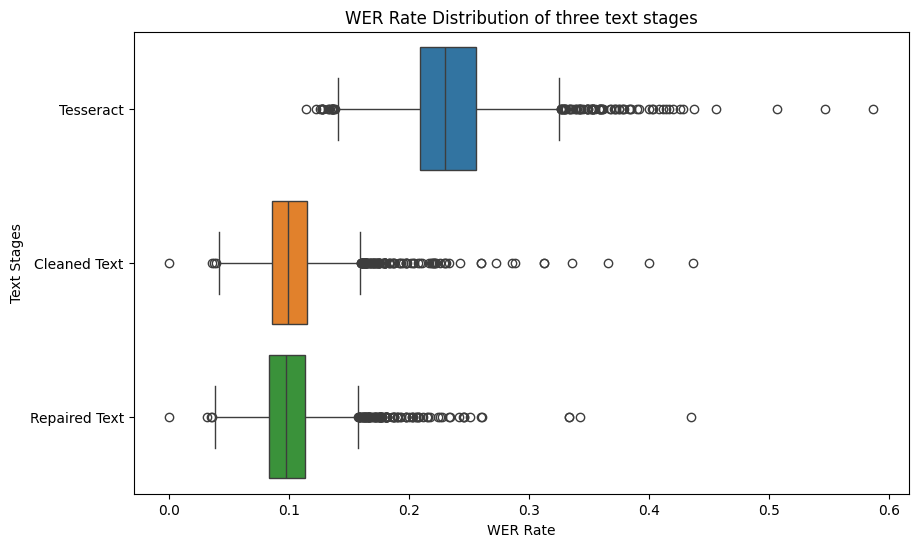

In [42]:
boxplot_data = {
    'Tesseract': data['WER_tesseract'],
    'Cleaned Text': data['WER_cleaned'],
    'Repaired Text': data['WER_repaired']
}
boxplot_df = pd.DataFrame(boxplot_data)

plt.figure(figsize=(10, 6))
sns.boxplot(data=boxplot_df, orient='h')  #'orient' used parameter to flip the axes
plt.title('WER Rate Distribution of three text stages')
plt.xlabel('WER Rate')
plt.ylabel('Text Stages')
plt.show()

In [43]:
# Compare the Word Error Rates
average_WER_tesseract = data['WER_tesseract'].mean()
average_WER_cleaned = data['WER_cleaned'].mean()
average_WER_repaired = data['WER_repaired'].mean()

print("Average Word Error Rate in original Tesseract text:", average_WER_tesseract)
print("Average Word Error Rate in Cleaned text:", average_WER_cleaned)
print("Average Word Error Rate in repaired text:", average_WER_repaired)


Average Word Error Rate in original Tesseract text: 0.23519231933164111
Average Word Error Rate in Cleaned text: 0.10376668138332609
Average Word Error Rate in repaired text: 0.10122228045959909


In [44]:
for index, row in data.iterrows():
    document_id = row['foi_documentId']
    original_text = row['tesseract']
    repaired_text = row['repaired_text']

    WER_original = calculate_WER_pyspellchecker(original_text)
    WER_repaired = calculate_WER_pyspellchecker(repaired_text)

    print(f"Document ID: {document_id}")
    print("Original Text:")
    print(original_text)
    print("Word Error Rate in Original Text:", WER_original)
    print("Repaired Text:")
    print(repaired_text)
    print("Word Error Rate in Repaired Text:", WER_repaired)
    print()

Streaminguitvoer ingekort tot de laatste 5000 regels.
Word Error Rate in Original Text: 0.28270042194092826
Repaired Text:
deelbesluit op uw wobverzoek onze referentie wob geachte in uw brief van mei heeft u met een beroep op de wet openbaarheid van bestuur hierna wob verzocht om informatie. wobverzoek u vraagt in uw verzoek om informatie over het beleid van rvo.nl het ministerie van landbouw natuur en visserij hierna lnv en het ministerie van economische zaken en klimaat hierna ezk inzake de ontheffing van fosfaatrechten uit de meststoffenwet de knelgevallenregeling en de beoordeling van artikel ep. dit verzoek heeft u verder gespecificeerd in onderstaande punten. punt besluitvorming beslissingen op bezwaar u vraagt om informatie over de beslissingen op bezwaar met de kenmerken en .dit verzoek ziet specifiek maar niet uitsluitend op de volgende aspecten van de besluitvorming het advies dat gegeven is door de betrokken ambtenaren met betrekking tot de besluitvorming op voornoemde beslu

<ipython-input-45-8f28a402af31>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(x='Mean_WER', y='Method', data=means, palette='viridis')


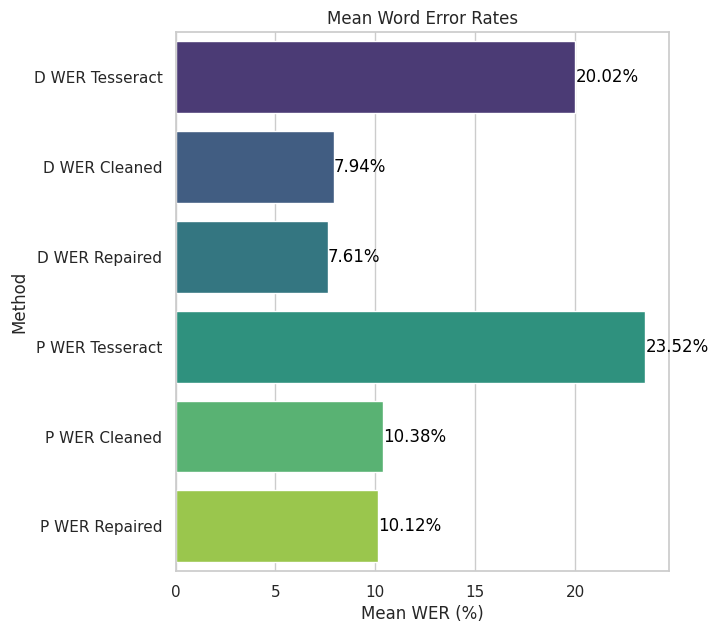

In [45]:
#Calculate means
mean_old_WER_tesseract = data['old_WER_tesseract'].mean() * 100
mean_old_WER_cleaned = data['old_WER_cleaned'].mean() * 100
mean_old_WER_repaired = data['old_WER_repaired'].mean() * 100
mean_WER_tesseract = data['WER_tesseract'].mean() * 100
mean_WER_cleaned = data['WER_cleaned'].mean() * 100
mean_WER_repaired = data['WER_repaired'].mean() * 100

#Prepare data for plotting means
means = pd.DataFrame({
    'Method': ['D WER Tesseract', 'D WER Cleaned', 'D WER Repaired',
               'P WER Tesseract', 'P WER Cleaned', 'P WER Repaired'],
    'Mean_WER': [mean_old_WER_tesseract, mean_old_WER_cleaned, mean_old_WER_repaired,
                 mean_WER_tesseract, mean_WER_cleaned, mean_WER_repaired]
})

#Prepare data for line plot of all data points
data_long = pd.melt(data, id_vars=[], value_vars=['old_WER_tesseract', 'old_WER_cleaned', 'old_WER_repaired',
                                                  'WER_tesseract', 'WER_cleaned', 'WER_repaired'],
                    var_name='Method', value_name='WER')

plt.figure(figsize=(14, 7))
sns.set(style="whitegrid")

# Horizontal bar plot of means
plt.subplot(1, 2, 1)
barplot = sns.barplot(x='Mean_WER', y='Method', data=means, palette='viridis')
barplot.set_title('Mean Word Error Rates')
barplot.set_xlabel('Mean WER (%)')
barplot.set_ylabel('Method')

# Add percentages on the bars
for index, value in enumerate(means['Mean_WER']):
    plt.text(value, index, f'{value:.2f}%', va='center', ha='left', color='black')

plt.show()

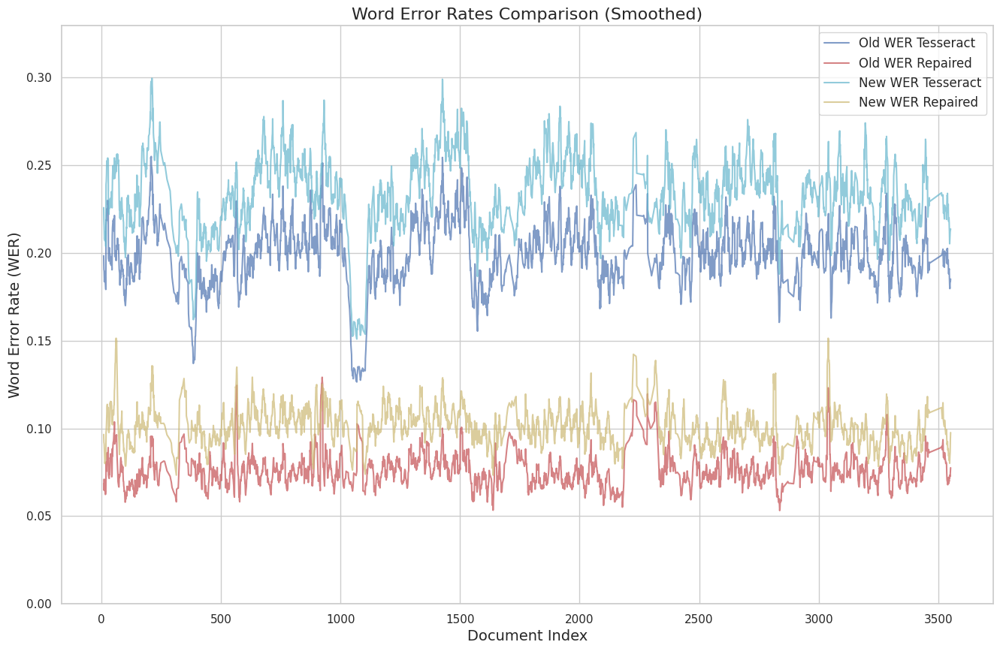

In [46]:
sns.set(style="whitegrid")

# Apply a rolling average to smooth the data
data['smooth_old_WER_tesseract'] = data['old_WER_tesseract'].rolling(window=10).mean()
#data['smooth_old_WER_cleaned'] = data['old_WER_cleaned'].rolling(window=10).mean()
data['smooth_old_WER_repaired'] = data['old_WER_repaired'].rolling(window=10).mean()
data['smooth_WER_tesseract'] = data['WER_tesseract'].rolling(window=10).mean()
#data['smooth_WER_cleaned'] = data['WER_cleaned'].rolling(window=10).mean()
data['smooth_WER_repaired'] = data['WER_repaired'].rolling(window=10).mean()


plt.figure(figsize=(16, 10))

#Plot each smoothed WER series with a different color and label
plt.plot(data.index, data['smooth_old_WER_tesseract'], label='Old WER Tesseract', color='b', alpha=0.7)
#plt.plot(data.index, data['smooth_old_WER_cleaned'], label='Old WER Cleaned', color='g', alpha=0.7)
plt.plot(data.index, data['smooth_old_WER_repaired'], label='Old WER Repaired', color='r', alpha=0.7)
plt.plot(data.index, data['smooth_WER_tesseract'], label='New WER Tesseract', color='c', alpha=0.7)
#plt.plot(data.index, data['smooth_WER_cleaned'], label='New WER Cleaned', color='m', alpha=0.7)
plt.plot(data.index, data['smooth_WER_repaired'], label='New WER Repaired', color='y', alpha=0.7)

#Set plot title and labels
plt.title('Word Error Rates Comparison (Smoothed)', fontsize=16)
plt.xlabel('Document Index', fontsize=14)
plt.ylabel('Word Error Rate (WER)', fontsize=14)

#Adjust the y-axis limit to fit the data better
plt.ylim(0, max(data[['smooth_old_WER_tesseract', 'smooth_old_WER_repaired', 'smooth_WER_tesseract', 'smooth_WER_repaired']].max()) * 1.1)

#Add a legend
plt.legend(loc='best', fontsize=12)

#Show grid lines for better readability
plt.grid(True)


## Top 20 Most frequently Occuring Non Dictionary Words Using PySpellChecker

In [47]:
def find_non_dictionary_words(text, spell_en, spell_nl):
    # Remove punctuation
    text = re.sub(r'[^\w\s]', '', text)
    words = text.split()
    misspelled = [word for word in words if word.lower() not in spell_en and word.lower() not in spell_nl]
    return list(misspelled)

In [48]:
spell_en = SpellChecker(language='en')
spell_nl = SpellChecker(language='nl')


In [49]:
data['non_dictionary_words'] = data['repaired_text'].apply(lambda text: find_non_dictionary_words(text, spell_en, spell_nl))


In [50]:
all_non_dict_words = [word for sublist in data['non_dictionary_words'] for word in sublist]
word_freq = Counter(all_non_dict_words)


In [51]:
top_20_words = word_freq.most_common(20)
top_20_words_df = pd.DataFrame(top_20_words, columns=['word', 'frequency'])


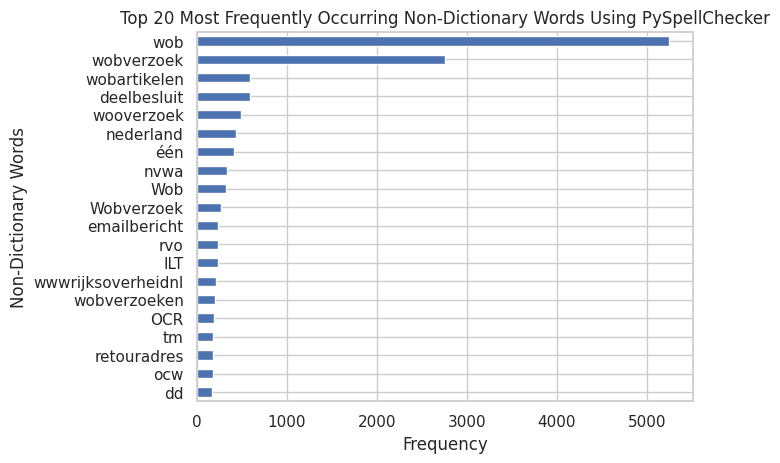

In [52]:
#Visualize the frequency of the top 20 words using a horizontal bar chart
top_20_words_df.plot(kind='barh', x='word', y='frequency', legend=False)
plt.ylabel('Non-Dictionary Words')
plt.xlabel('Frequency')
plt.title('Top 20 Most Frequently Occurring Non-Dictionary Words Using PySpellChecker')
plt.gca().invert_yaxis()  #To display the highest frequency at the top
plt.show()

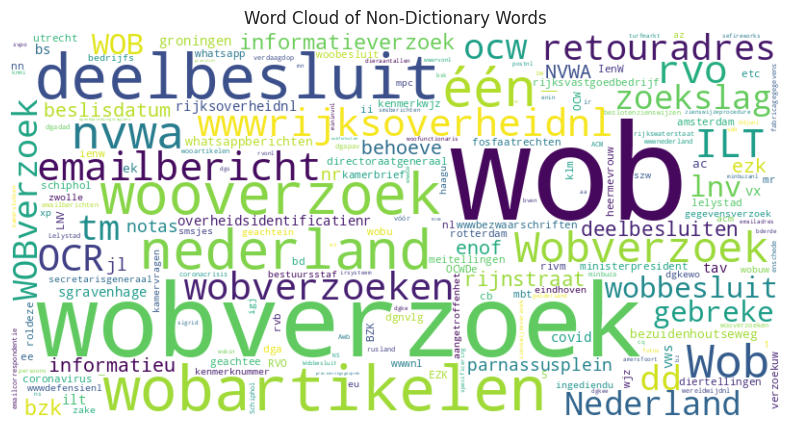

In [53]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Non-Dictionary Words')
plt.show()


In [54]:
data

,foi_documentId,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,pdftotext,...,old_WER_cleaned,old_WER_repaired,WER_tesseract,WER_cleaned,WER_repaired,smooth_old_WER_tesseract,smooth_old_WER_repaired,smooth_WER_tesseract,smooth_WER_repaired,non_dictionary_words
0,nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,NaN,...,0.089109,0.077966,0.257790,0.135314,0.122034,NaN,NaN,NaN,NaN,"[wobbesluit, covid, volkskrant, wob, ingediend..."
1,nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,NaN,...,0.068592,0.061594,0.222222,0.093863,0.090580,NaN,NaN,NaN,NaN,"[wobbesluit, griekenland, heermevrouw, Wob, zm..."
2,nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,NaN,...,0.088083,0.085561,0.218487,0.108808,0.101604,NaN,NaN,NaN,NaN,"[wobbesluit, wob, ingediendu, sidn, rijksoverh..."
3,nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,NaN,...,0.059701,0.056604,0.200000,0.111940,0.109434,NaN,NaN,NaN,NaN,"[denemarken, faeröer, faeröer, wob, denemarken..."
4,nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,NaN,...,0.091803,0.074324,0.259053,0.134426,0.118243,NaN,NaN,NaN,NaN,"[wobbesluit, coronamaatregelen, wob, ingediend..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3548,nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,\n\n\n\n ...,...,0.061303,0.058366,0.164516,0.072797,0.062257,0.181598,0.071689,0.205226,0.080113,"[domeinnaamregister, cqeen, emailcommunicatie,..."
3549,nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,\n\n\n\n\n\n\n\n\n\n\n >Retouradres ...,...,0.077465,0.082734,0.251381,0.119718,0.125899,0.179666,0.073347,0.208351,0.084142,"[deelbesluit, ddmaart, pasmelding, lelystad, m..."
3550,nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,\n\n\n\n\n\n\n ...,...,0.061889,0.062814,0.227513,0.084691,0.092965,0.183974,0.072629,0.212036,0.086439,"[wooverzoek, wwwbezwaarschriften, OCWDe, OCR, ..."
3551,nl.mnre1018.2i.2023.14.doc.1,74859,1116305,Ministerie Van Defensie,mnre1018,NaN,2023-03-28,2023,1,\n\n\n\n\n ...,...,0.108280,0.101307,0.236842,0.143312,0.133987,0.183695,0.075027,0.212899,0.093652,"[wooverzoek, wooin, KMar, Libanese, grensagent..."


## Semantic Similarity Metric

In [55]:
# Load Spacy model
nlp_spacy = spacy.load("en_core_web_md")

# Load Sentence Transformer model
model_st = SentenceTransformer('distilbert-base-nli-mean-tokens')

# Load TFHub Universal Sentence Encoder
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

# Function to compute Spacy similarity
def spacy_similarity(text1, text2):
    doc1 = nlp_spacy(text1)
    doc2 = nlp_spacy(text2)
    return doc1.similarity(doc2)

# Function to compute Sentence Transformers similarity
def st_similarity(text1, text2):
    embeddings = model_st.encode([text1, text2])
    return util.pytorch_cos_sim(embeddings[0], embeddings[1]).item()

# Function to compute Universal Sentence Encoder similarity
def use_similarity(text1, text2):
    embeddings = embed([text1, text2])
    return 1 - distance.cosine(embeddings[0], embeddings[1])



/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [56]:
data['tesseract'] = data['tesseract'].astype(str)

# Compute similarities and create new columns
data['spacy_similarity'] = data.apply(lambda row: spacy_similarity(row['repaired_text'], row['tesseract']), axis=1)
data['st_similarity'] = data.apply(lambda row: st_similarity(row['repaired_text'], row['tesseract']), axis=1)
data['use_similarity'] = data.apply(lambda row: use_similarity(row['repaired_text'], row['tesseract']), axis=1)

# Display the DataFrame with new similarity columns
data

,foi_documentId,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,pdftotext,...,WER_cleaned,WER_repaired,smooth_old_WER_tesseract,smooth_old_WER_repaired,smooth_WER_tesseract,smooth_WER_repaired,non_dictionary_words,spacy_similarity,st_similarity,use_similarity
0,nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,NaN,...,0.135314,0.122034,NaN,NaN,NaN,NaN,"[wobbesluit, covid, volkskrant, wob, ingediend...",0.890670,0.745658,0.963336
1,nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,NaN,...,0.093863,0.090580,NaN,NaN,NaN,NaN,"[wobbesluit, griekenland, heermevrouw, Wob, zm...",0.956146,0.707195,0.952612
2,nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,NaN,...,0.108808,0.101604,NaN,NaN,NaN,NaN,"[wobbesluit, wob, ingediendu, sidn, rijksoverh...",0.945523,0.730085,0.951288
3,nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,NaN,...,0.111940,0.109434,NaN,NaN,NaN,NaN,"[denemarken, faeröer, faeröer, wob, denemarken...",0.962546,0.715125,0.960404
4,nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,NaN,...,0.134426,0.118243,NaN,NaN,NaN,NaN,"[wobbesluit, coronamaatregelen, wob, ingediend...",0.903662,0.722032,0.947386
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3548,nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,\n\n\n\n ...,...,0.072797,0.062257,0.181598,0.071689,0.205226,0.080113,"[domeinnaamregister, cqeen, emailcommunicatie,...",0.965584,0.777402,0.967423
3549,nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,\n\n\n\n\n\n\n\n\n\n\n >Retouradres ...,...,0.119718,0.125899,0.179666,0.073347,0.208351,0.084142,"[deelbesluit, ddmaart, pasmelding, lelystad, m...",0.935009,0.806833,0.948762
3550,nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,\n\n\n\n\n\n\n ...,...,0.084691,0.092965,0.183974,0.072629,0.212036,0.086439,"[wooverzoek, wwwbezwaarschriften, OCWDe, OCR, ...",0.912356,0.854162,0.943567
3551,nl.mnre1018.2i.2023.14.doc.1,74859,1116305,Ministerie Van Defensie,mnre1018,NaN,2023-03-28,2023,1,\n\n\n\n\n ...,...,0.143312,0.133987,0.183695,0.075027,0.212899,0.093652,"[wooverzoek, wooin, KMar, Libanese, grensagent...",0.949681,0.820581,0.979526


<ipython-input-57-67bb4206188b>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Similarity_Score', y='Similarity_Metric', data=data_melted, palette='viridis')


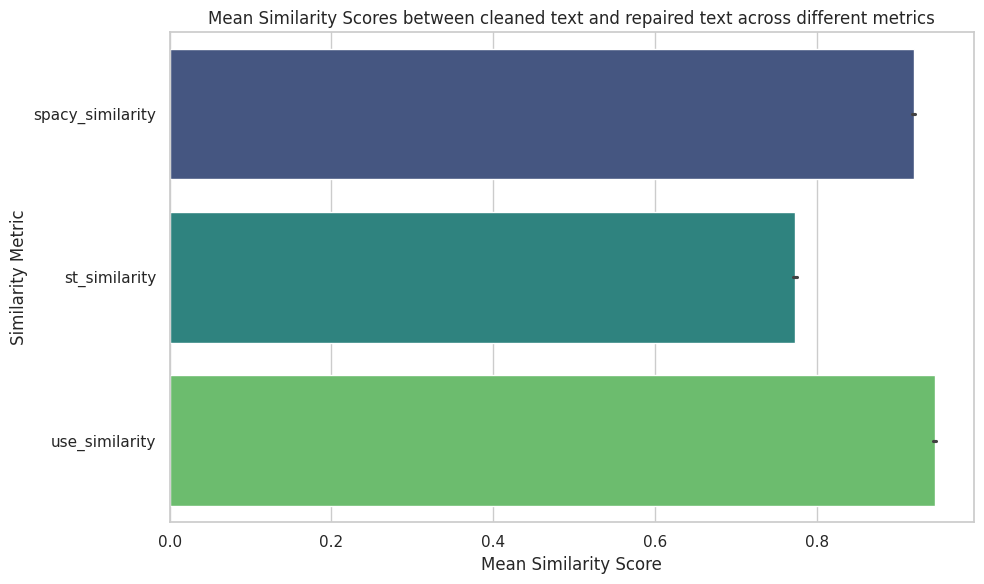

In [57]:
# Melt the DataFrame
data_melted = data.melt(id_vars=['repaired_text', 'cleaned_text'],
                      value_vars=['spacy_similarity', 'st_similarity', 'use_similarity'],
                      var_name='Similarity_Metric',
                      value_name='Similarity_Score')

#Create a combined bar plot of similarities
plt.figure(figsize=(10, 6))
sns.barplot(x='Similarity_Score', y='Similarity_Metric', data=data_melted, palette='viridis')
plt.xlabel('Mean Similarity Score')
plt.ylabel('Similarity Metric')
plt.title('Mean Similarity Scores between cleaned text and repaired text across different metrics')
plt.tight_layout()
plt.show()

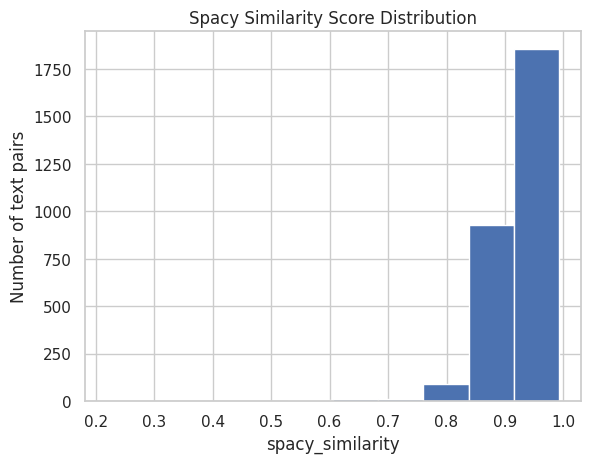

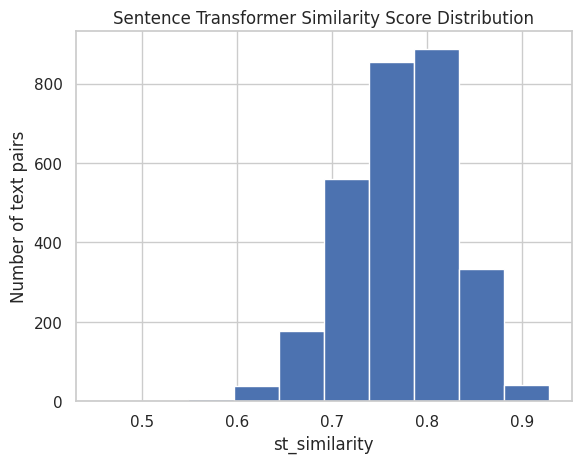

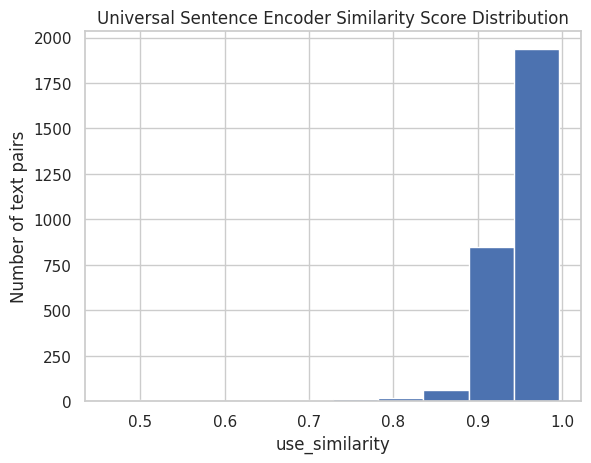


High Similarity Text Samples between cleaned text and repaired text
DOI: nl.mnre1073.2i.2020.41.misc.1
Repaired_text: het definitieve rapport van bevindingen esfn. zienswijze het verzoek is getoetst aan de bepalingen van de wob. op grond van artikel van de algemene wet bestuursrecht heb ik de belanghebbende in de gelegenheid gesteld te reageren op het wob verzoek. de belanghebbende heeft aangegeven geen bedenkingen te hebben tegen openbaarmaking mits de bedrijfsnamen buiten reikwijdte worden geplaatst. ik stel vast dat de bedrijfsnamen buiten de reikwijdte van het verzoek vallen. ik heb om deze reden de in het rapport voorkomende bedrijfsnamen onleesbaar gemaakt. overwegingen ik ben nagegaan of er sprake is van in de wet vastgelegde uitzonderingsgronden die het openbaar maken van de genoemde documenten of delen daarvan in de weg zouden kunnen staan. persoonsgegevens op grond van artikel tweede lid aanhef en onder e van de wob blijft verstrekking van informatie achterwege voor zover he

In [58]:
# Function to plot distribution of similarity scores
def plot_distribution(data, col_name, title):
  plt.hist(data[col_name])
  plt.xlabel(col_name)
  plt.ylabel("Number of text pairs")
  plt.title(title)
  plt.grid(True)
  plt.show()

# Plot distribution for each method
plot_distribution(data, "spacy_similarity", "Spacy Similarity Score Distribution")
plot_distribution(data, "st_similarity", "Sentence Transformer Similarity Score Distribution")
plot_distribution(data, "use_similarity", "Universal Sentence Encoder Similarity Score Distribution")

# Sample high and low similarity pairs (adjust sample size as needed)
num_samples = 5

# Sort data by spacy similarity (replace with desired method for high/low sampling)
sorted_data = data.sort_values(by=["spacy_similarity"])

# High similarity samples
high_sim_samples = sorted_data.tail(num_samples)

# Low similarity samples
low_sim_samples = sorted_data.head(num_samples)

# Function to display sample text pairs
def show_text_samples(data, title):
  print(f"\n{title}")
  for idx, row in data.iterrows():
    print(f"DOI: {row['foi_documentId']}")
    print(f"Repaired_text: {row['repaired_text']}")
    print(f"Cleaned_text: {row['cleaned_text']}")
    print(f"Similarity Score: {row['spacy_similarity']}\n")

# Display high similarity samples
show_text_samples(high_sim_samples, "High Similarity Text Samples between cleaned text and repaired text")

# Display low similarity samples
show_text_samples(low_sim_samples, "Low Similarity Text Samples between cleaned text and repaired text")


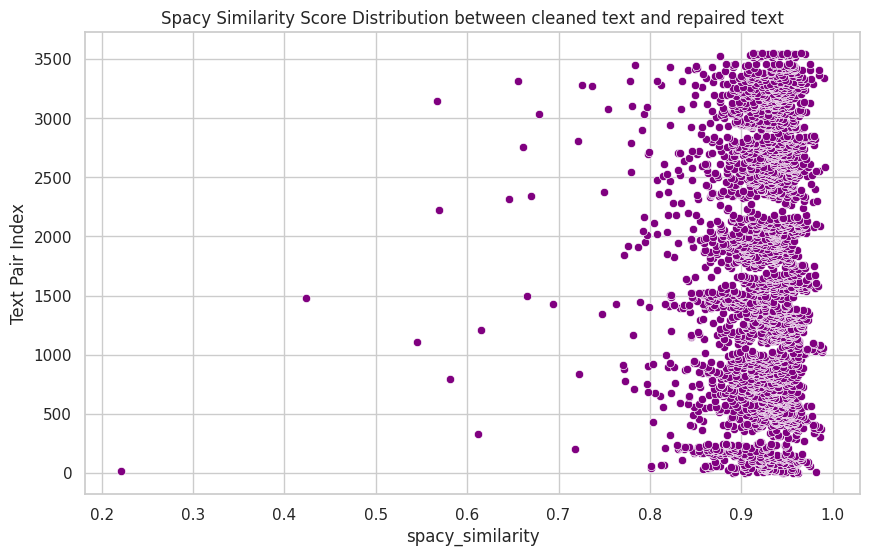

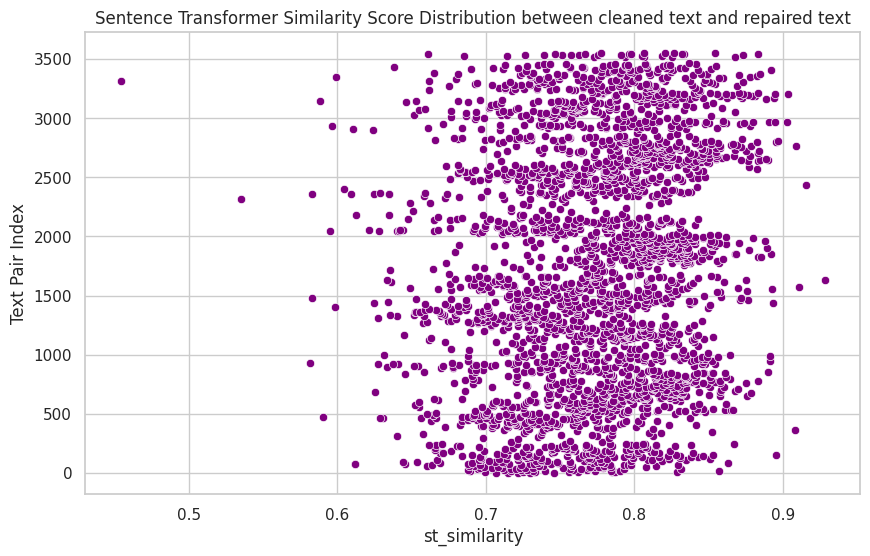

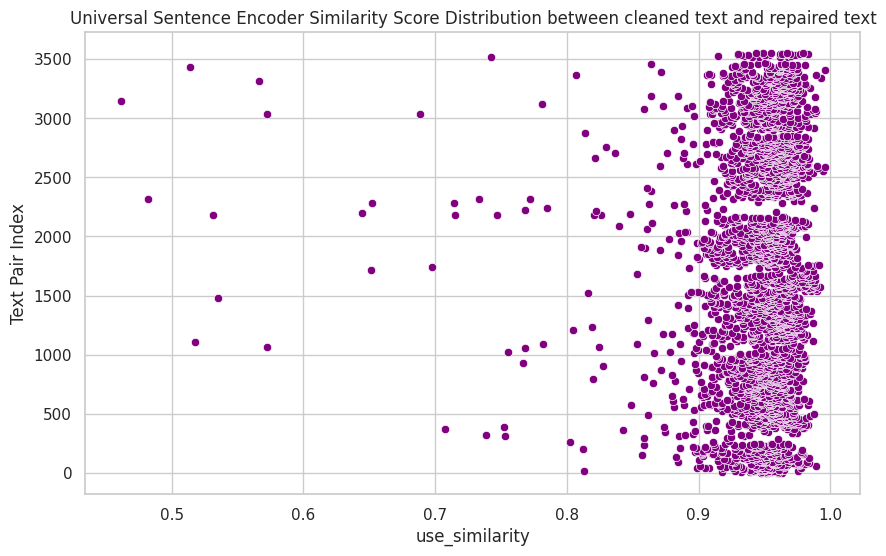

In [59]:
def plot_scatter(data, col_name, title):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=data, y=data.index, x=col_name, color='purple')
    plt.ylabel('Text Pair Index')
    plt.xlabel(col_name)
    plt.title(title)
    plt.grid(True)
    plt.show()

# Plot scatter plot for each method
plot_scatter(data, "spacy_similarity", "Spacy Similarity Score Distribution between cleaned text and repaired text")
plot_scatter(data, "st_similarity", "Sentence Transformer Similarity Score Distribution between cleaned text and repaired text")
plot_scatter(data, "use_similarity", "Universal Sentence Encoder Similarity Score Distribution between cleaned text and repaired text")

<Figure size 1000x600 with 0 Axes>

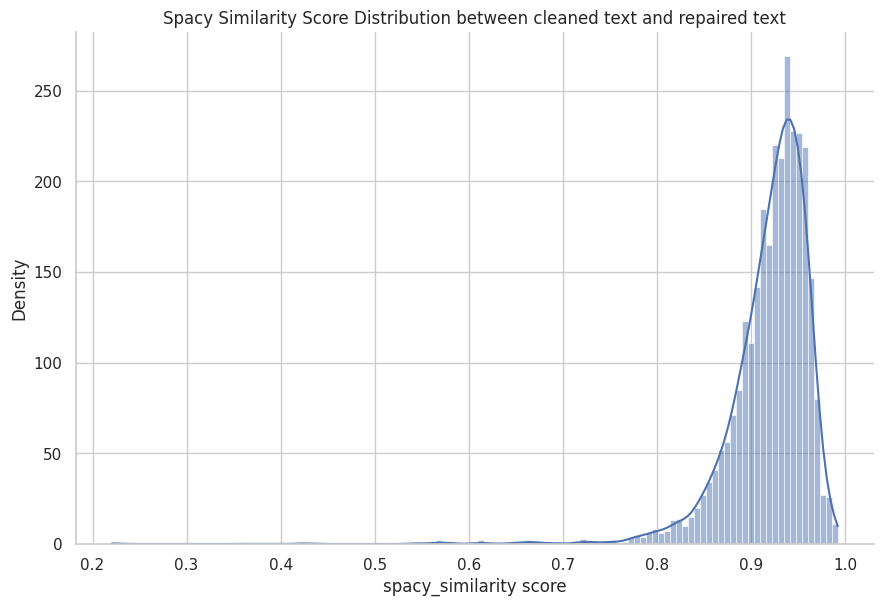

<Figure size 1000x600 with 0 Axes>

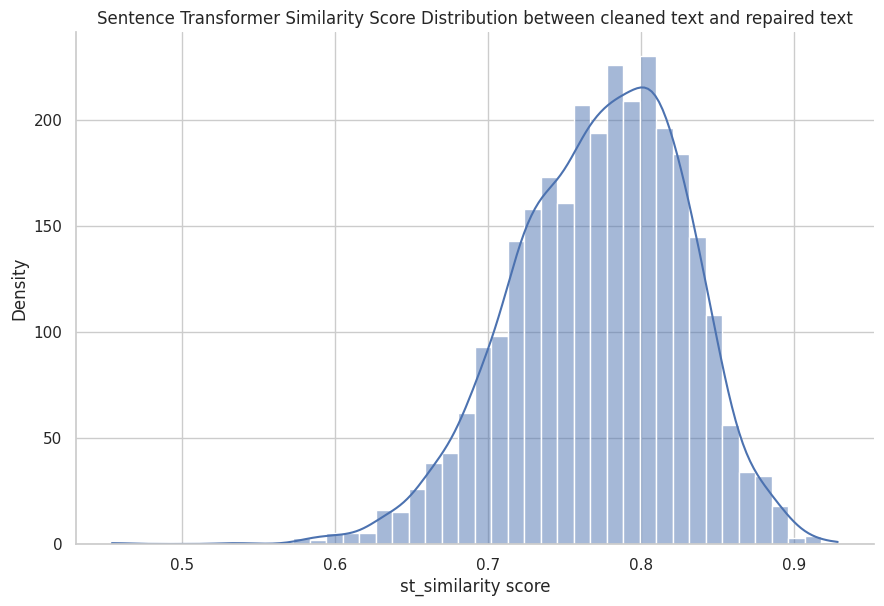

<Figure size 1000x600 with 0 Axes>

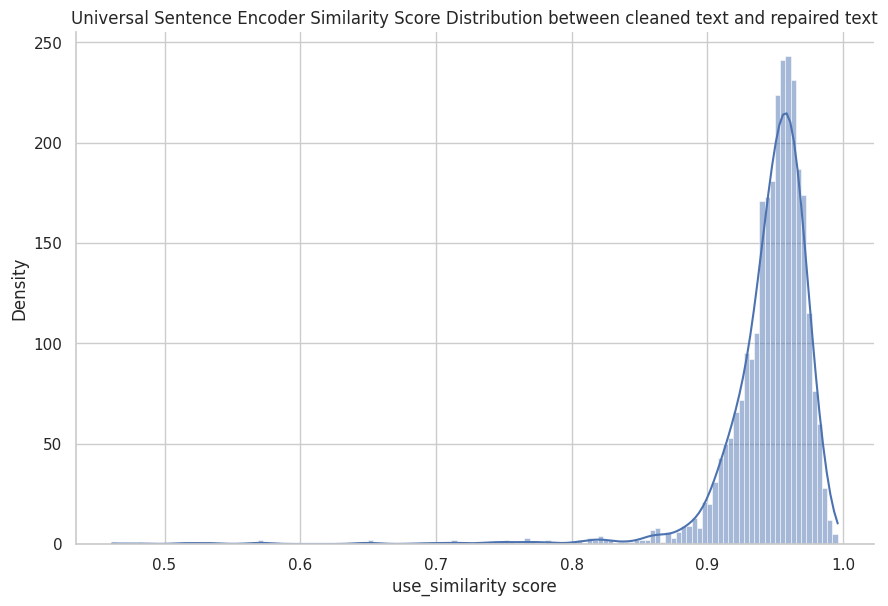

In [60]:
# Function to plot distribution of similarity scores with flipped axes
def plot_distribution(data, col_name, title):
    plt.figure(figsize=(10, 6))
    sns.displot(data=data, x=col_name, aspect=1.5, height=6, kde=True)
    plt.xlabel(col_name+" score")
    plt.ylabel('Density')
    plt.title(title)
    plt.grid(True)
    plt.show()

# Plot distribution for each method
plot_distribution(data, "spacy_similarity", "Spacy Similarity Score Distribution between cleaned text and repaired text")
plot_distribution(data, "st_similarity", "Sentence Transformer Similarity Score Distribution between cleaned text and repaired text")
plot_distribution(data, "use_similarity", "Universal Sentence Encoder Similarity Score Distribution between cleaned text and repaired text")

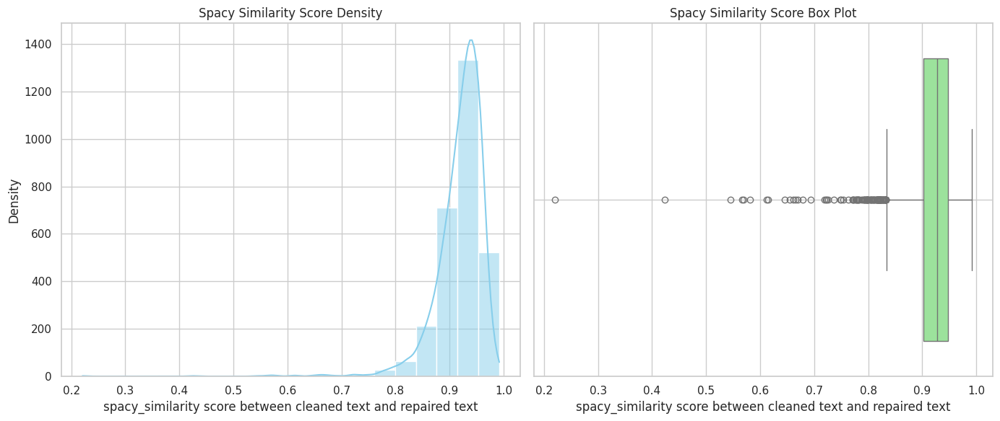

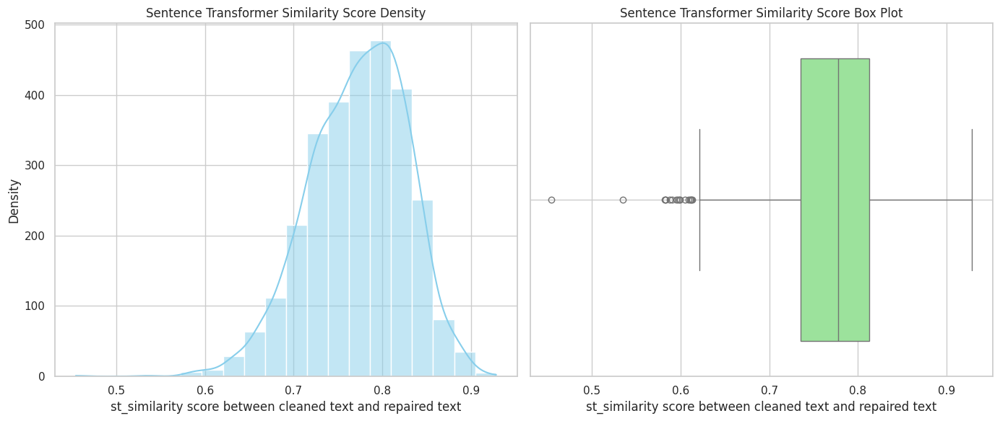

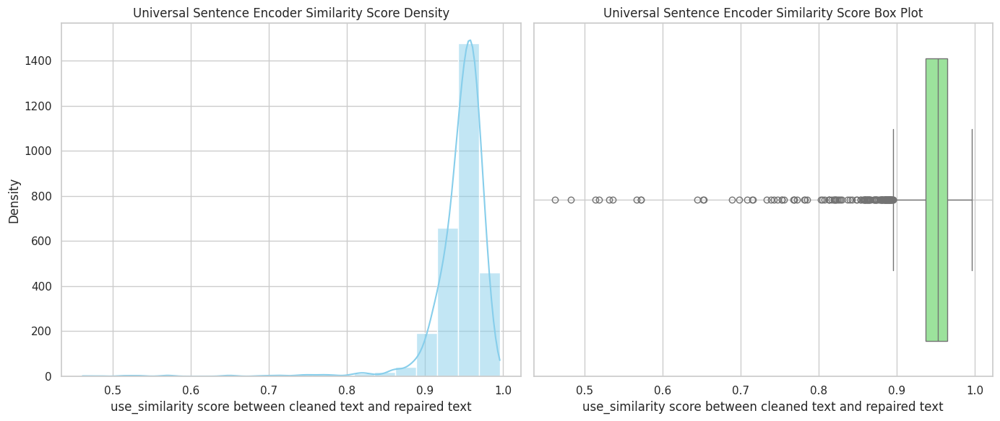

In [61]:
def plot_distribution(data, col_name, title):
    plt.figure(figsize=(14, 6))

    #Plot density distribution
    plt.subplot(1, 2, 1)
    sns.histplot(data=data, x=col_name, kde=True, color='skyblue', bins=20)
    plt.xlabel(col_name + ' score between cleaned text and repaired text')
    plt.ylabel('Density')
    plt.title(title + ' Density')
    plt.grid(True)

    # Plot box plot
    plt.subplot(1, 2, 2)
    sns.boxplot(data=data, x=col_name, color='lightgreen')
    plt.xlabel(col_name + ' score between cleaned text and repaired text')
    plt.title(title + ' Box Plot')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

plot_distribution(data, "spacy_similarity", "Spacy Similarity Score")
plot_distribution(data, "st_similarity", "Sentence Transformer Similarity Score")
plot_distribution(data, "use_similarity", "Universal Sentence Encoder Similarity Score")


## Lexical Similarity Metrics

In [62]:
# Function to calculate Levenshtein distance, handling NaN values
def calculate_levenshtein(row):
    tesseract_text = str(row['cleaned_text'])
    repaired_text = str(row['repaired_text'])
    return lev_distance(tesseract_text, repaired_text)

In [63]:
# Apply the function to each row in the DataFrame
data['levenshtein_distance'] = data.apply(calculate_levenshtein, axis=1)

In [64]:
print(data.columns)

Index(['foi_documentId', 'index', 'Unnamed: 0', 'dc_publisher_name',
       'dc_publisher', 'foi_requestDate', 'foi_decisionDate', 'dc_date_year',
       'foi_pageNumber', 'pdftotext', 'tesseract', 'foi_hasOCR',
       'foi_redacted', 'foi_nrRedactedRegions', 'foi_contourArea',
       'foi_textArea', 'foi_charArea', 'foi_percentageTextAreaRedacted',
       'foi_percentageCharAreaRedacted', 'foi_nrWords', 'foi_nrChars',
       'foi_nrWordsOCR', 'foi_nrCharsOCR', 'updated_pdftotext', 'cleaned_text',
       'repaired_text', 'tesseract_word_count', 'cleaned_word_count',
       'repaired_word_count', 'old_WER_tesseract', 'old_WER_cleaned',
       'old_WER_repaired', 'WER_tesseract', 'WER_cleaned', 'WER_repaired',
       'smooth_old_WER_tesseract', 'smooth_old_WER_repaired',
       'smooth_WER_tesseract', 'smooth_WER_repaired', 'non_dictionary_words',
       'spacy_similarity', 'st_similarity', 'use_similarity',
       'levenshtein_distance'],
      dtype='object')


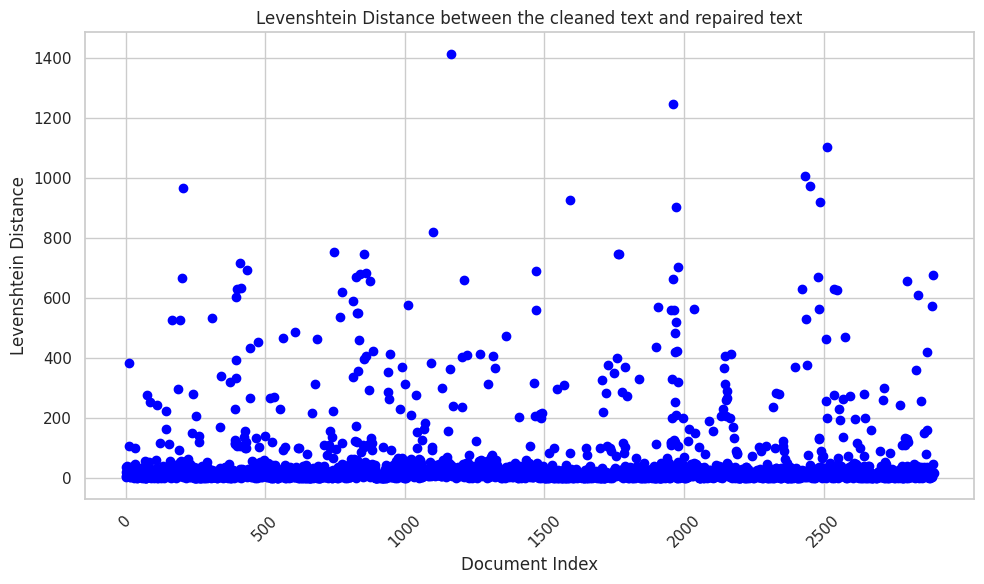

In [65]:
document_index_column = 'index'
levenshtein_distance_column = 'levenshtein_distance'

#Scatter plot setup
plt.figure(figsize=(10, 6))
plt.scatter(range(len(data)), data[levenshtein_distance_column], color='blue')
plt.title('Levenshtein Distance between the cleaned text and repaired text')
plt.xlabel('Document Index')
plt.ylabel('Levenshtein Distance')

#Customize x-axis ticks to show intervals of 500
tick_interval = 500
num_ticks = len(data) // tick_interval + 1
plt.xticks(range(0, len(data), tick_interval), range(0, len(data), tick_interval), rotation=45)

plt.grid(True)
plt.tight_layout()
plt.show()

In [66]:
def calculate_jaccard_similarity(text1, text2):
    # Tokenize texts into sets of words
    words1 = set(word_tokenize(text1.lower()))
    words2 = set(word_tokenize(text2.lower()))

    # Calculate Jaccard similarity
    intersection = len(words1.intersection(words2))
    union = len(words1.union(words2))
    similarity = intersection / union if union != 0 else 0

    return similarity

# Apply function to calculate Jaccard similarity between repaired and unrepaired text
data['jaccard_distance'] = data.apply(lambda row: calculate_jaccard_similarity(row['tesseract'], row['repaired_text']), axis=1)

# Print the first few rows of the DataFrame with the new column
#print(data.head())

# Optionally, save the updated DataFrame to a CSV file
#data.to_csv('DataWithLexicalSimilarity.csv', index=False)

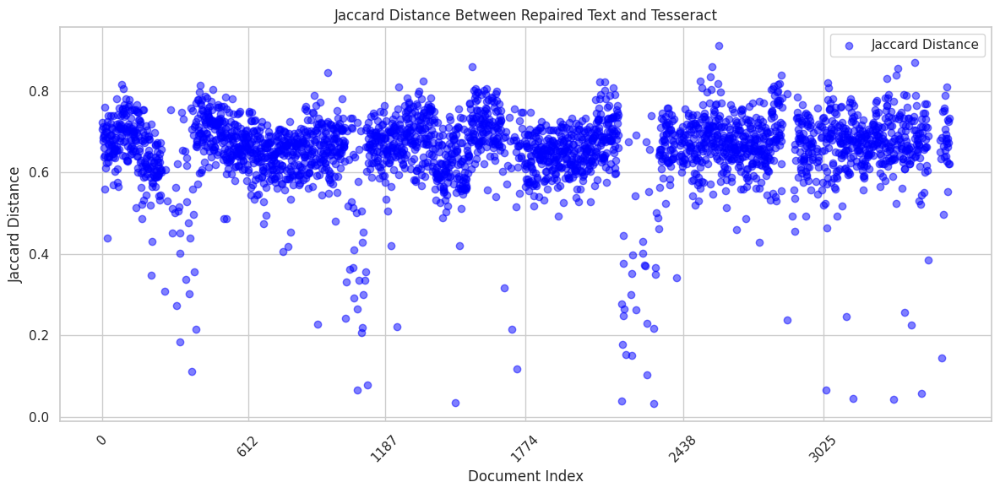

In [67]:
# Plot all data points with slight transparency for better visualization
plt.figure(figsize=(12, 6))
plt.scatter(data.index, data['jaccard_distance'], color='blue', alpha=0.5, label='Jaccard Distance')

# Set plot labels and title
plt.title('Jaccard Distance Between Repaired Text and Tesseract')
plt.xlabel('Document Index')
plt.ylabel('Jaccard Distance')
plt.xticks(rotation=45)

# Customize x-axis ticks to show only a subset of document indices
tick_interval = 500  # Show every 500th document index
plt.xticks(data.index[::tick_interval], data.index[::tick_interval])

plt.grid(True)
plt.legend()

# Show plot
plt.tight_layout()
plt.show()


In [68]:
data

,foi_documentId,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,pdftotext,...,smooth_old_WER_tesseract,smooth_old_WER_repaired,smooth_WER_tesseract,smooth_WER_repaired,non_dictionary_words,spacy_similarity,st_similarity,use_similarity,levenshtein_distance,jaccard_distance
0,nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,NaN,...,NaN,NaN,NaN,NaN,"[wobbesluit, covid, volkskrant, wob, ingediend...",0.890670,0.745658,0.963336,38,0.705314
1,nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,NaN,...,NaN,NaN,NaN,NaN,"[wobbesluit, griekenland, heermevrouw, Wob, zm...",0.956146,0.707195,0.952612,5,0.723164
2,nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,NaN,...,NaN,NaN,NaN,NaN,"[wobbesluit, wob, ingediendu, sidn, rijksoverh...",0.945523,0.730085,0.951288,20,0.677215
3,nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,NaN,...,NaN,NaN,NaN,NaN,"[denemarken, faeröer, faeröer, wob, denemarken...",0.962546,0.715125,0.960404,8,0.712707
4,nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,NaN,...,NaN,NaN,NaN,NaN,"[wobbesluit, coronamaatregelen, wob, ingediend...",0.903662,0.722032,0.947386,40,0.685990
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3548,nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,\n\n\n\n ...,...,0.181598,0.071689,0.205226,0.080113,"[domeinnaamregister, cqeen, emailcommunicatie,...",0.965584,0.777402,0.967423,13,0.672414
3549,nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,\n\n\n\n\n\n\n\n\n\n\n >Retouradres ...,...,0.179666,0.073347,0.208351,0.084142,"[deelbesluit, ddmaart, pasmelding, lelystad, m...",0.935009,0.806833,0.948762,21,0.620513
3550,nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,\n\n\n\n\n\n\n ...,...,0.183974,0.072629,0.212036,0.086439,"[wooverzoek, wwwbezwaarschriften, OCWDe, OCR, ...",0.912356,0.854162,0.943567,677,0.724891
3551,nl.mnre1018.2i.2023.14.doc.1,74859,1116305,Ministerie Van Defensie,mnre1018,NaN,2023-03-28,2023,1,\n\n\n\n\n ...,...,0.183695,0.075027,0.212899,0.093652,"[wooverzoek, wooin, KMar, Libanese, grensagent...",0.949681,0.820581,0.979526,47,0.732673


In [69]:
repaired_texts = data['repaired_text'].tolist()
tesseract_texts = data['cleaned_text'].tolist()

# Initialize TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer()

# Fit and transform TF-IDF vectorizer on the combined text corpus
tfidf_matrix = tfidf_vectorizer.fit_transform(repaired_texts + tesseract_texts)

# Extract TF-IDF vectors for repaired_texts and tesseract_texts
repaired_tfidf = tfidf_matrix[:len(repaired_texts)]
tesseract_tfidf = tfidf_matrix[len(repaired_texts):]

# Convert to dense format for cosine similarity computation
repaired_tfidf_dense = repaired_tfidf.toarray()
tesseract_tfidf_dense = tesseract_tfidf.toarray()

In [70]:
# Compute cosine similarity between corresponding pairs of TF-IDF vectors
cosine_similarities = []
for i in range(len(repaired_tfidf_dense)):
    cosine_similarities.append(cosine_similarity([repaired_tfidf_dense[i]], [tesseract_tfidf_dense[i]])[0][0])

# Add cosine similarities to DataFrame
data['tfidf_cosine_similarity'] = cosine_similarities

# Display the DataFrame with TF-IDF cosine similarity column added
#print(data.head())  # Adjust as needed to view the DataFrame

In [71]:
# Define highest and lowest TF-IDF score DataFrames
highest_tfidf_scores = data.nlargest(5, 'tfidf_cosine_similarity')
lowest_tfidf_scores = data.nsmallest(5, 'tfidf_cosine_similarity')

def print_examples(df):
    for idx, row in df.iterrows():
        print(row['foi_documentId'])  # idx is already an integer, no need to convert to string
        print(f"TF-IDF Cosine Similarity: {row['tfidf_cosine_similarity']:.4f}")
        print("Repaired Text:")
        print(row['repaired_text'])
        print("Cleaned Text:")
        print(row['cleaned_text'])
        print()

# Print highest scores
print("Highest Scores in repaired_text based on TF-IDF cosine similarity:")
print_examples(highest_tfidf_scores)
print("\n--------------------------------------------------------\n")

# Print lowest scores
print("Lowest Scores in repaired_text based on TF-IDF cosine similarity:")
print_examples(lowest_tfidf_scores)



Highest Scores in repaired_text based on TF-IDF cosine similarity:
nl.mnre1013.2i.2020.52.misc.1
TF-IDF Cosine Similarity: 1.0000
Repaired Text:
reactie op uw wobverzoek geachte heer bij brief van januari ontvangen op januari heeft u voor zover thans voor dit deelbesluit relevant met een beroep op de wet openbaarheid van bestuur wob verzocht om documenten met betrekking tot de totstandkoming van het thematisch ambtsbericht rwanda . u vraagt alle documenten van het ministerie m.b.t. aanvraag voorbereiding publicatie en gebruik van het thematisch ambtsbericht over mensenrechten en justitie in rwanda van augustus . de ontvangst van uw verzoek is schriftelijk bevestigd op januari . op januari en april heeft overleg plaats gevonden tussen u en mijn ministerie over de wijze van afhandeling van uw verzoek. op januari is de beslistermijn met vier weken verdaagd. op augustus heeft u het eerste van twee deelbesluiten ontvangen. op november heeft u mij in gebreke gesteld. met betrekking tot uw ve

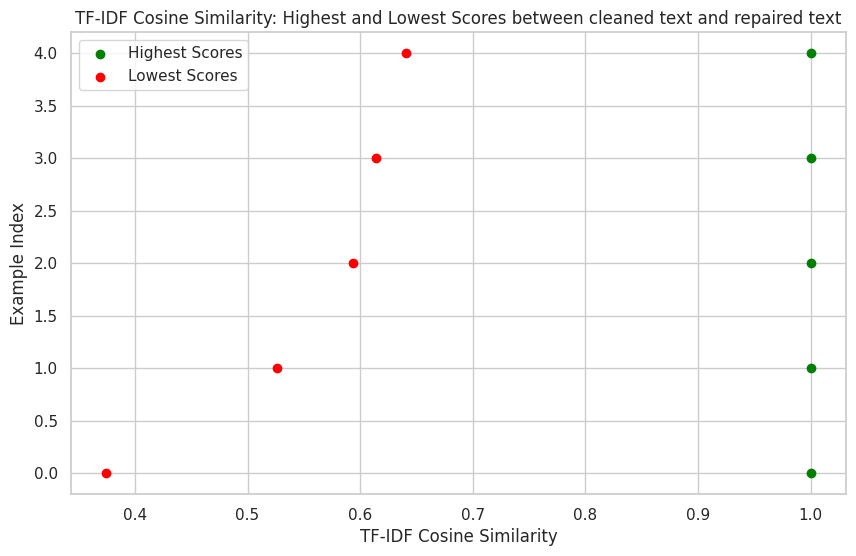

In [73]:
# Plot the scatter plot for TF-IDF cosine similarity
plt.figure(figsize=(10, 6))
plt.scatter(highest_tfidf_scores['tfidf_cosine_similarity'], range(len(highest_tfidf_scores)), color='green', label='Highest Scores')
plt.scatter(lowest_tfidf_scores['tfidf_cosine_similarity'], range(len(lowest_tfidf_scores)), color='red', label='Lowest Scores')
plt.xlabel('TF-IDF Cosine Similarity')
plt.ylabel('Example Index')
plt.title('TF-IDF Cosine Similarity: Highest and Lowest Scores between cleaned text and repaired text')
plt.legend()
plt.grid(True)
plt.show()

In [74]:
data

,foi_documentId,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,pdftotext,...,smooth_old_WER_repaired,smooth_WER_tesseract,smooth_WER_repaired,non_dictionary_words,spacy_similarity,st_similarity,use_similarity,levenshtein_distance,jaccard_distance,tfidf_cosine_similarity
0,nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,NaN,...,NaN,NaN,NaN,"[wobbesluit, covid, volkskrant, wob, ingediend...",0.890670,0.745658,0.963336,38,0.705314,0.977458
1,nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,NaN,...,NaN,NaN,NaN,"[wobbesluit, griekenland, heermevrouw, Wob, zm...",0.956146,0.707195,0.952612,5,0.723164,0.991287
2,nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,NaN,...,NaN,NaN,NaN,"[wobbesluit, wob, ingediendu, sidn, rijksoverh...",0.945523,0.730085,0.951288,20,0.677215,0.934161
3,nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,NaN,...,NaN,NaN,NaN,"[denemarken, faeröer, faeröer, wob, denemarken...",0.962546,0.715125,0.960404,8,0.712707,0.984536
4,nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,NaN,...,NaN,NaN,NaN,"[wobbesluit, coronamaatregelen, wob, ingediend...",0.903662,0.722032,0.947386,40,0.685990,0.950740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3548,nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,\n\n\n\n ...,...,0.071689,0.205226,0.080113,"[domeinnaamregister, cqeen, emailcommunicatie,...",0.965584,0.777402,0.967423,13,0.672414,0.964270
3549,nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,\n\n\n\n\n\n\n\n\n\n\n >Retouradres ...,...,0.073347,0.208351,0.084142,"[deelbesluit, ddmaart, pasmelding, lelystad, m...",0.935009,0.806833,0.948762,21,0.620513,1.000000
3550,nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,\n\n\n\n\n\n\n ...,...,0.072629,0.212036,0.086439,"[wooverzoek, wwwbezwaarschriften, OCWDe, OCR, ...",0.912356,0.854162,0.943567,677,0.724891,0.940866
3551,nl.mnre1018.2i.2023.14.doc.1,74859,1116305,Ministerie Van Defensie,mnre1018,NaN,2023-03-28,2023,1,\n\n\n\n\n ...,...,0.075027,0.212899,0.093652,"[wooverzoek, wooin, KMar, Libanese, grensagent...",0.949681,0.820581,0.979526,47,0.732673,0.973763


In [75]:
# Initialize TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Fit and transform texts to TF-IDF vectors
tfidf_repaired = vectorizer.fit_transform(data['repaired_text'])
tfidf_cleaned = vectorizer.transform(data['cleaned_text'])

# Convert TF-IDF vectors to dense arrays
tfidf_repaired_array = tfidf_repaired.toarray()
tfidf_cleaned_array = tfidf_cleaned.toarray()


In [76]:
# Calculate Euclidean distances
distances = []
for i in range(len(data['repaired_text'])):
    distance = np.linalg.norm(tfidf_repaired_array[i] - tfidf_cleaned_array[i])
    distances.append(distance)

# Add distances to DataFrame
data['euclidean_distance'] = distances

# Display the DataFrame with the new column
df = pd.DataFrame(data)
print(df)


                     foi_documentId  index  Unnamed: 0  \
0     nl.mnre1010.2i.2020.21.misc.1      0           0   
1     nl.mnre1010.2i.2020.22.misc.1      5           5   
2     nl.mnre1010.2i.2020.23.misc.1      7           7   
3     nl.mnre1010.2i.2020.25.misc.1     21          21   
4     nl.mnre1010.2i.2020.26.misc.1     23          23   
...                             ...    ...         ...   
3548    nl.mnre1010.2i.2023.3.doc.1  74839     1115499   
3549  nl.mnre1153.2i.2023.100.doc.1  74841     1115501   
3550   nl.mnre1109.2i.2023.17.doc.1  74850     1116245   
3551   nl.mnre1018.2i.2023.14.doc.1  74859     1116305   
3552  nl.mnre1153.2i.2023.101.doc.1  74930     1116376   

                                      dc_publisher_name dc_publisher  \
0                         Ministerie van Algemene Zaken     mnre1010   
1                         Ministerie van Algemene Zaken     mnre1010   
2                         Ministerie van Algemene Zaken     mnre1010   
3              

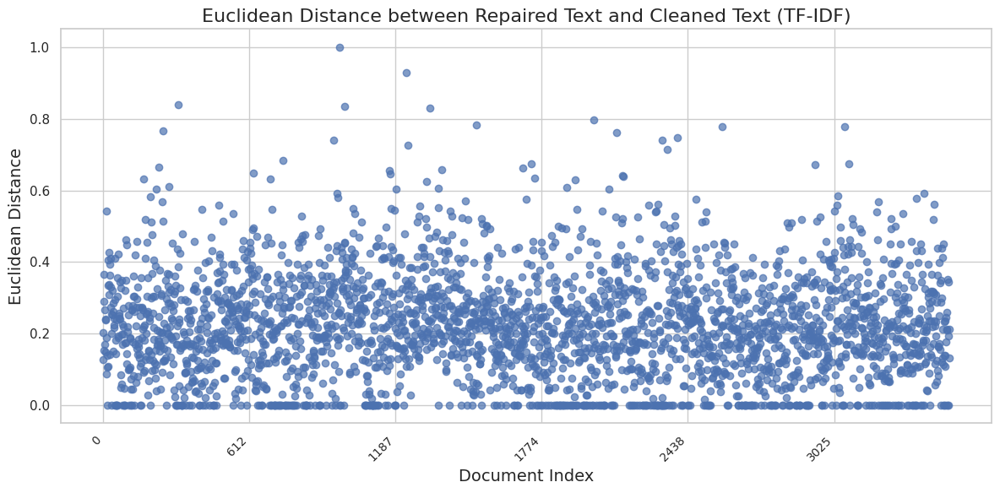

In [77]:
plt.figure(figsize=(12, 6))
plt.scatter(np.arange(len(df)), df['euclidean_distance'], color='b', alpha=0.7)
plt.title('Euclidean Distance between Repaired Text and Cleaned Text (TF-IDF)', fontsize=16)
plt.xlabel('Document Index', fontsize=14)
plt.ylabel('Euclidean Distance', fontsize=14)

# Adjust x-axis ticks to show every 500th document index
tick_interval = 500
plt.xticks(np.arange(0, len(df), step=tick_interval), df.index[::tick_interval], rotation=45, ha='right', fontsize=10)

plt.grid(True)
plt.tight_layout()
plt.show()


<ipython-input-78-04a520ae4344>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(x=mean_scores.index, y=mean_scores.values, palette="viridis", alpha=0.85)


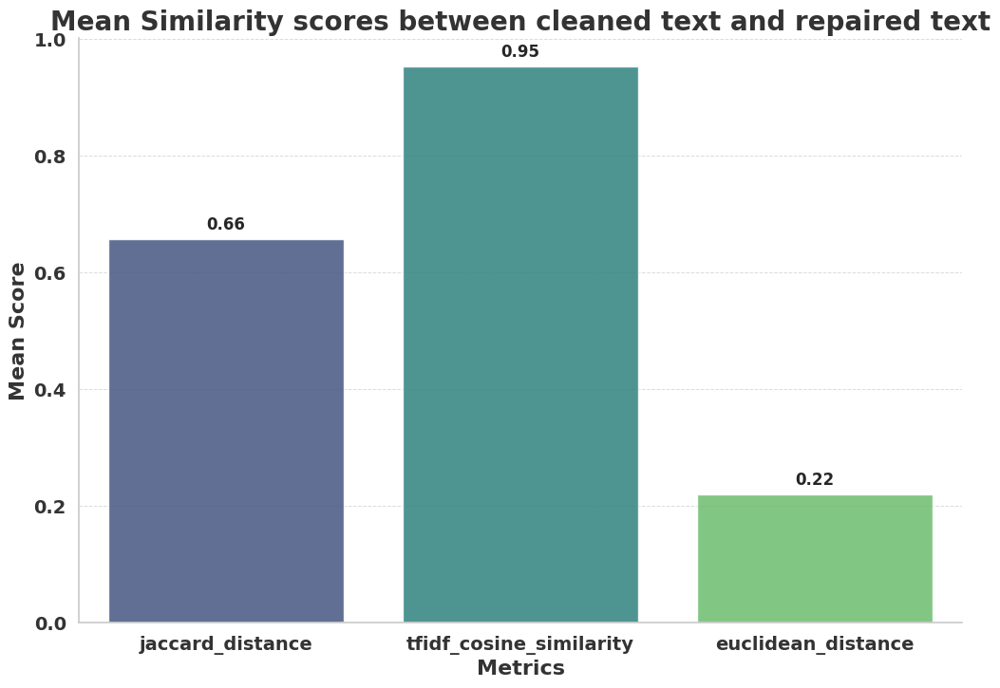

In [78]:
sns.set(style="whitegrid")

#Calculate the mean scores
mean_scores = data[['jaccard_distance', 'tfidf_cosine_similarity', 'euclidean_distance']].mean()

plt.figure(figsize=(12, 8))
barplot = sns.barplot(x=mean_scores.index, y=mean_scores.values, palette="viridis", alpha=0.85)

for index, value in enumerate(mean_scores):
    plt.text(index, value + 0.01, f'{value:.2f}', ha='center', va='bottom', fontsize=12, fontweight='bold')

plt.title('Mean Similarity scores between cleaned text and repaired text', fontsize=20, fontweight='bold', color='#333333')
plt.xlabel('Metrics', fontsize=16, fontweight='bold', color='#333333')
plt.ylabel('Mean Score', fontsize=16, fontweight='bold', color='#333333')

plt.xticks(fontsize=14, fontweight='bold', color='#333333')
plt.yticks(fontsize=14, fontweight='bold', color='#333333')
plt.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)

sns.despine(top=True, right=True)

plt.show()

## Sentiment Analysis DO NOT RUN THESE CELL BLOCKS

In [ ]:
from transformers import RobertaTokenizer, RobertaForSequenceClassification
tokenizer = RobertaTokenizer.from_pretrained("DTAI-KULeuven/robbert-v2-dutch-sentiment")
model = RobertaForSequenceClassification.from_pretrained("DTAI-KULeuven/robbert-v2-dutch-sentiment")

tokenizer_config.json:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/733k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/383k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.12M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/875 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/467M [00:00<?, ?B/s]

In [ ]:
def get_sentiment(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=512)
    with torch.no_grad():
        outputs = model(**inputs)
    logits = outputs.logits
    predicted_class = torch.argmax(logits, dim=1).item()
    return predicted_class

# Apply the sentiment analysis function to the 'repaired_text' column
data['sentiment'] = data['repaired_text'].apply(get_sentiment)

# Print the sentiment column
print(data['sentiment'])

0       0
1       0
2       1
3       0
4       0
       ..
3548    0
3549    1
3550    0
3551    0
3552    0
Name: sentiment, Length: 2895, dtype: int64


In [ ]:
from transformers import RobertaTokenizer, RobertaForSequenceClassification
tokenizer = RobertaTokenizer.from_pretrained("pdelobelle/robBERT-base")
model = RobertaForSequenceClassification.from_pretrained("pdelobelle/robBERT-base")

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/504 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at pdelobelle/robBERT-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
def get_sentiment(text):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, padding=True, max_length=512)
    with torch.no_grad():
        outputs = model(**inputs)
    logits = outputs.logits
    predicted_class = torch.argmax(logits, dim=1).item()
    return predicted_class

# Apply the sentiment analysis function to the 'repaired_text' column
data['sentiment-RobbertBase'] = data['repaired_text'].apply(get_sentiment)

# Print the sentiment column
print(data['sentiment'])

0       0
1       0
2       1
3       0
4       0
       ..
3548    0
3549    1
3550    0
3551    0
3552    0
Name: sentiment, Length: 2895, dtype: int64


In [ ]:
data

NameError: name 'data' is not defined

In [ ]:
data.to_csv('DataFrameSentimentFinished.csv')

### START RUNNING FROM HERE

In [79]:
# Assuming `foi_documentId` is the unique identifier column in your dataframe

# Replace 'your_document_id_here' with the actual document ID you want to retrieve
document_id = 'nl.mnre1153.2i.2021.188.misc.1'

# Find the row with the specified document ID
row = data[data['foi_documentId'] == document_id]

# Check if the row exists
if not row.empty:
    # Print the document contents
    print(f"Document ID: {document_id}")
    print("Tesseract Text:")
    print(row['tesseract'].values[0])  # Print the value of the 'tesseract' column

    print("\nCleaned Text:")
    print(row['cleaned_text'].values[0])  # Print the value of the 'cleaned_text' column

    print("\nRepaired Text:")
    print(row['repaired_text'].values[0])  # Print the value of the 'repaired_text' column
else:
    print(f"No document found with ID: {document_id}")


Document ID: nl.mnre1153.2i.2021.188.misc.1
Tesseract Text:
    Rijksdienst voor Ondernemend  Nederland    > Retouradres Postbus 40225 8004 DE Zwolle    Rijksdienst voor  Ondernemend Nederland  Vergunningen en Handhaving    Mandemaat 3  Assen   Postbus 40225  8004 DE Zwolle  www.rvo.nl    Contactpersoon  Mevr.  Wob-medewerker    T 088 042 42 42  KPEU_Wob@rvo.nl    Datum 28 september 2021 Onze referentie  Betreft Besluit op uw Wob-verzoek WOB/2021/097    Geachte heer    In uw e-mail van 21 april 2021 heeft u, met een beroep op de Wet openbaarheid  van bestuur (hierna: Wob), verzocht om informatie.    U vraagt om documenten met informatie aangaande diertellingen (meitellingen)  en het aantal geregistreerde dieren op elke eerste dag van de maand uit het  Identificatie en Registratiesysteem (hierna: I&R systeem), van de locatie  Bruinehorstweg 13, 6741 PL te Lunteren, over de periode 1989 tot en met 2021.    Procedure   De ontvangst van uw verzoek is schriftelijk bevestigd bij brief van 10

### Calculating the Similarities between the cleaned text and the repaired text

### Lexical Similarity Metrics

In [81]:
data = pd.read_csv("DataFrameRepairFinished.csv")

In [83]:
# Function to calculate Levenshtein distance, handling NaN values
def calculate_levenshtein(row):
    tesseract_text = str(row['cleaned_text'])
    repaired_text = str(row['repaired_text'])
    return lev_distance(tesseract_text, repaired_text)

In [84]:
# Apply the function to each row in the DataFrame
df['c_r_levenshtein_distance'] = df.apply(calculate_levenshtein, axis=1)

In [85]:
df

,foi_documentId,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,pdftotext,...,smooth_WER_repaired,non_dictionary_words,spacy_similarity,st_similarity,use_similarity,levenshtein_distance,jaccard_distance,tfidf_cosine_similarity,euclidean_distance,c_r_levenshtein_distance
0,nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,NaN,...,NaN,"[wobbesluit, covid, volkskrant, wob, ingediend...",0.890670,0.745658,0.963336,38,0.705314,0.977458,2.035827e-01,38
1,nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,NaN,...,NaN,"[wobbesluit, griekenland, heermevrouw, Wob, zm...",0.956146,0.707195,0.952612,5,0.723164,0.991287,1.270838e-01,5
2,nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,NaN,...,NaN,"[wobbesluit, wob, ingediendu, sidn, rijksoverh...",0.945523,0.730085,0.951288,20,0.677215,0.934161,3.666407e-01,20
3,nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,NaN,...,NaN,"[denemarken, faeröer, faeröer, wob, denemarken...",0.962546,0.715125,0.960404,8,0.712707,0.984536,1.534893e-01,8
4,nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,NaN,...,NaN,"[wobbesluit, coronamaatregelen, wob, ingediend...",0.903662,0.722032,0.947386,40,0.685990,0.950740,2.906493e-01,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3548,nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,\n\n\n\n ...,...,0.080113,"[domeinnaamregister, cqeen, emailcommunicatie,...",0.965584,0.777402,0.967423,13,0.672414,0.964270,1.938299e-01,13
3549,nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,\n\n\n\n\n\n\n\n\n\n\n >Retouradres ...,...,0.084142,"[deelbesluit, ddmaart, pasmelding, lelystad, m...",0.935009,0.806833,0.948762,21,0.620513,1.000000,1.767376e-16,21
3550,nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,\n\n\n\n\n\n\n ...,...,0.086439,"[wooverzoek, wwwbezwaarschriften, OCWDe, OCR, ...",0.912356,0.854162,0.943567,677,0.724891,0.940866,3.443128e-01,677
3551,nl.mnre1018.2i.2023.14.doc.1,74859,1116305,Ministerie Van Defensie,mnre1018,NaN,2023-03-28,2023,1,\n\n\n\n\n ...,...,0.093652,"[wooverzoek, wooin, KMar, Libanese, grensagent...",0.949681,0.820581,0.979526,47,0.732673,0.973763,2.123717e-01,47


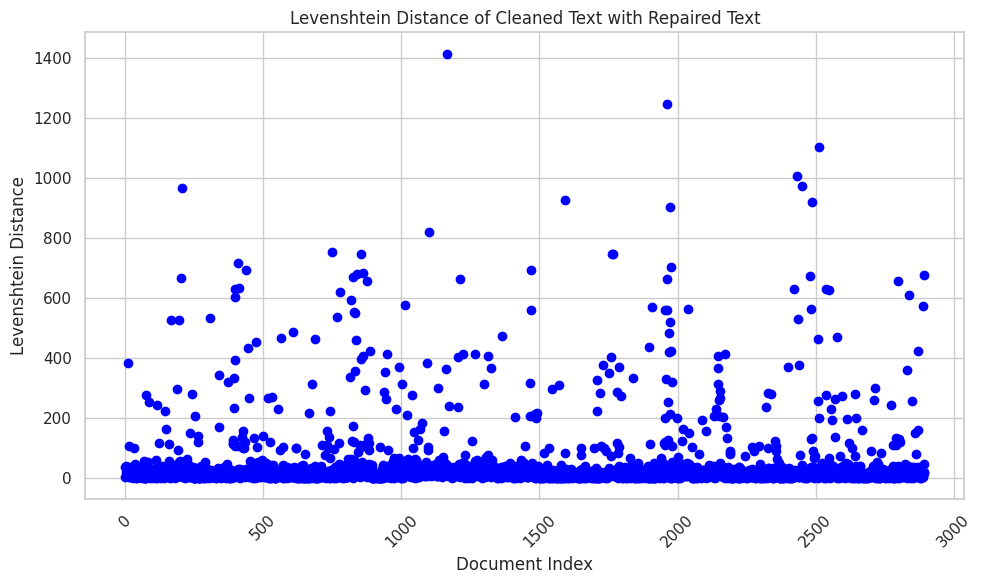

In [89]:
document_index_column = 'index'
levenshtein_distance_column = 'c_r_levenshtein_distance'  #Levenshtein distance column


plt.figure(figsize=(10, 6))
plt.scatter(range(len(df)), df[levenshtein_distance_column], color='blue')
plt.title('Levenshtein Distance of Cleaned Text with Repaired Text')
plt.xlabel('Document Index')
plt.ylabel('Levenshtein Distance')

tick_interval = 1
num_ticks = len(df) // tick_interval + 1
plt.xticks(rotation=45)

plt.grid(True)
plt.tight_layout()
plt.show()

In [91]:
#calculate Jaccard similarity
def calculate_jaccard_similarity(text1, text2):
    # Tokenize texts into sets of words
    words1 = set(word_tokenize(text1.lower()))
    words2 = set(word_tokenize(text2.lower()))

    # Calculate Jaccard similarity
    intersection = len(words1.intersection(words2))
    union = len(words1.union(words2))
    similarity = intersection / union if union != 0 else 0

    return similarity

# Apply function to calculate Jaccard similarity between repaired and unrepaired text
data['c_r_jaccard_distance'] = data.apply(lambda row: calculate_jaccard_similarity(row['cleaned_text'], row['repaired_text']), axis=1)


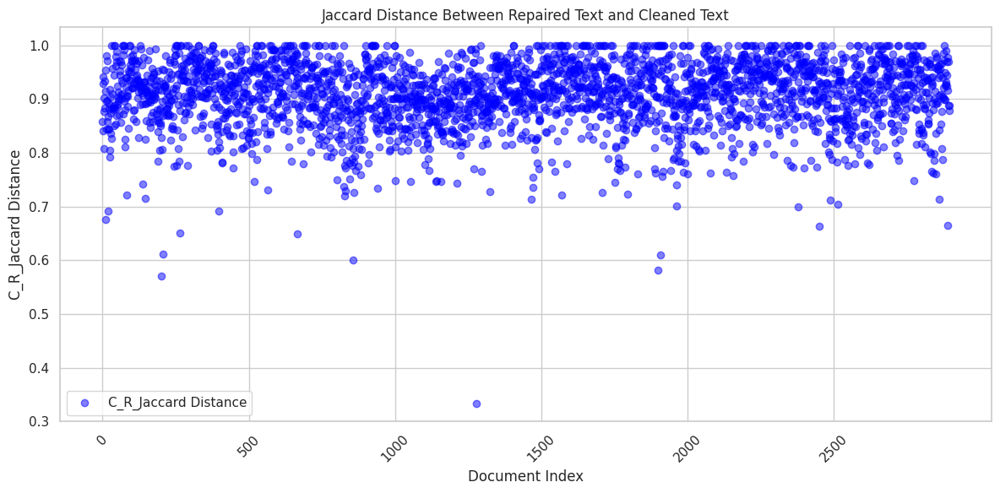

In [92]:
#Plot data points with slight transparency for better visualization
plt.figure(figsize=(12, 6))
plt.scatter(data.index, data['c_r_jaccard_distance'], color='blue', alpha=0.5, label='C_R_Jaccard Distance')

plt.title('Jaccard Distance Between Repaired Text and Cleaned Text')
plt.xlabel('Document Index')
plt.ylabel('C_R_Jaccard Distance')
plt.xticks(rotation=45)

tick_interval = 500  #shows every 500th document index
plt.xticks(data.index[::tick_interval], data.index[::tick_interval])

plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


In [93]:
data

,Unnamed: 0.1,foi_documentId,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,...,spacy_similarity,st_similarity,use_similarity,levenshtein_distance,jaccard_distance,tfidf_cosine_similarity,euclidean_distance,sentiment,sentiment-RobbertBase,c_r_jaccard_distance
0,0,nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,...,0.890670,0.745658,0.963336,550,0.705314,0.929075,0.457809,0,1,0.857988
1,1,nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,...,0.956146,0.707195,0.952612,526,0.723164,0.935623,0.508457,0,1,0.940741
2,2,nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,...,0.945523,0.730086,0.951288,508,0.677215,0.857970,0.619066,1,1,0.841270
3,3,nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,...,0.962546,0.715125,0.960404,504,0.712707,0.915746,0.462752,0,1,0.928571
4,4,nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,...,0.903662,0.722032,0.947386,548,0.685990,0.919642,0.456326,0,1,0.808140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2890,3548,nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,...,0.965584,0.777402,0.967423,455,0.672414,0.867665,0.546503,0,1,0.915385
2891,3549,nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,...,0.935009,0.806833,0.948762,704,0.620513,0.762720,0.732386,1,1,0.970149
2892,3550,nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,...,0.912356,0.854162,0.943567,1074,0.724891,0.828541,0.562303,0,1,0.887097
2893,3551,nl.mnre1018.2i.2023.14.doc.1,74859,1116305,Ministerie Van Defensie,mnre1018,NaN,2023-03-28,2023,1,...,0.949681,0.820581,0.979526,412,0.732673,0.930773,0.334013,0,1,0.888235


In [96]:
repaired_texts = data['repaired_text'].tolist()
tesseract_texts = data['tesseract'].tolist()

# Initialize TF-IDF Vectorizer
tfidf_vectorizer = TfidfVectorizer()

# Fit and transform TF-IDF vectorizer on the combined text corpus
tfidf_matrix = tfidf_vectorizer.fit_transform(repaired_texts + tesseract_texts)

# Extract TF-IDF vectors for repaired_texts and tesseract_texts
repaired_tfidf = tfidf_matrix[:len(repaired_texts)]
tesseract_tfidf = tfidf_matrix[len(repaired_texts):]

# Convert to dense format for cosine similarity computation
repaired_tfidf_dense = repaired_tfidf.toarray()
tesseract_tfidf_dense = tesseract_tfidf.toarray()

In [106]:
# Compute cosine similarity between tesseract and repaired text pairs of TF-IDF vectors
cosine_similarities = []
for i in range(len(repaired_tfidf_dense)):
    cosine_similarities.append(cosine_similarity([repaired_tfidf_dense[i]], [tesseract_tfidf_dense[i]])[0][0])

# Add cosine similarities to DataFrame
data['t_r_tfidf_cosine_similarity'] = cosine_similarities


In [121]:
# Define highest and lowest TF-IDF score DataFrames
highest_tfidf_scores = data.nlargest(5, 't_r_tfidf_cosine_similarity')
lowest_tfidf_scores = data.nsmallest(5, 't_r_tfidf_cosine_similarity')

def print_examples(df):
    for idx, row in df.iterrows():
        print(row['foi_documentId'])
        print(f"TF-IDF Cosine Similarity: {row['t_r_tfidf_cosine_similarity']:.4f}")
        print("Repaired Text:")
        print(row['repaired_text'])
        print("Tesseract Text:")
        print(row['tesseract'])
        print()

# Print highest scores
print("Highest Scores in repaired_text based on TF-IDF cosine similarity:")
print_examples(highest_tfidf_scores)
print("\n--------------------------------------------------------\n")

# Print lowest scores
print("Lowest Scores in repaired_text based on TF-IDF cosine similarity:")
print_examples(lowest_tfidf_scores)



Highest Scores in repaired_text based on TF-IDF cosine similarity:
nl.mnre1013.2i.2022.18.misc.1
TF-IDF Cosine Similarity: 0.9909
Repaired Text:
reaction on your public access request dear in your email of November you requested information on meetings of the Dutch permanent representation to the European Union invoking the Government Information Public Access Act Wet openbaarheid van bestuur Wob.the information you requested concerned the following how many meetings have employees of the permanent representation of the kingdom of the netherlands to the european union had with representatives of companies organisations and other lobbyists since july would like to request a list of these meetings including who was present at the meeting the names of the organisations and lobbyists present the date of the meeting and the subject matters discussed.the decision was postponed by four weeks on December.statutory framework your application falls within the scope of the Government Information 

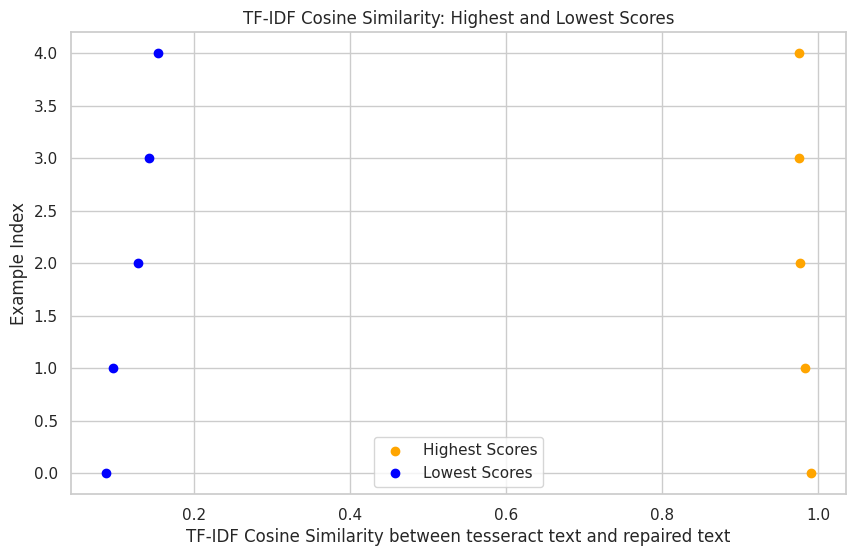

In [127]:
# Plot the scatter plot for TF-IDF cosine similarity
plt.figure(figsize=(10, 6))
plt.scatter(highest_tfidf_scores['t_r_tfidf_cosine_similarity'], range(len(highest_tfidf_scores)), color='orange', label='Highest Scores')
plt.scatter(lowest_tfidf_scores['t_r_tfidf_cosine_similarity'], range(len(lowest_tfidf_scores)), color='blue', label='Lowest Scores')
plt.xlabel('TF-IDF Cosine Similarity between tesseract text and repaired text')
plt.ylabel('Example Index')
plt.title('TF-IDF Cosine Similarity: Highest and Lowest Scores')
plt.legend()
plt.grid(True)
plt.show()

In [128]:
# Initialize TF-IDF vectorizer
vectorizer = TfidfVectorizer()

# Fit and transform texts to TF-IDF vectors
tfidf_repaired = vectorizer.fit_transform(data['repaired_text'])
tfidf_cleaned = vectorizer.transform(data['cleaned_text'])

# Convert TF-IDF vectors to dense arrays
tfidf_repaired_array = tfidf_repaired.toarray()
tfidf_cleaned_array = tfidf_cleaned.toarray()


In [129]:
# Calculate Euclidean distances
distances = []
for i in range(len(data['repaired_text'])):
    distance = np.linalg.norm(tfidf_repaired_array[i] - tfidf_cleaned_array[i])
    distances.append(distance)

# Add distances to DataFrame
data['c_r_euclidean_distance'] = distances

# Display the DataFrame with the new column
df = pd.DataFrame(data)
print(df)


      Unnamed: 0.1                 foi_documentId  index  Unnamed: 0  \
0                0  nl.mnre1010.2i.2020.21.misc.1      0           0   
1                1  nl.mnre1010.2i.2020.22.misc.1      5           5   
2                2  nl.mnre1010.2i.2020.23.misc.1      7           7   
3                3  nl.mnre1010.2i.2020.25.misc.1     21          21   
4                4  nl.mnre1010.2i.2020.26.misc.1     23          23   
...            ...                            ...    ...         ...   
2890          3548    nl.mnre1010.2i.2023.3.doc.1  74839     1115499   
2891          3549  nl.mnre1153.2i.2023.100.doc.1  74841     1115501   
2892          3550   nl.mnre1109.2i.2023.17.doc.1  74850     1116245   
2893          3551   nl.mnre1018.2i.2023.14.doc.1  74859     1116305   
2894          3552  nl.mnre1153.2i.2023.101.doc.1  74930     1116376   

                                      dc_publisher_name dc_publisher  \
0                         Ministerie van Algemene Zaken     mnr

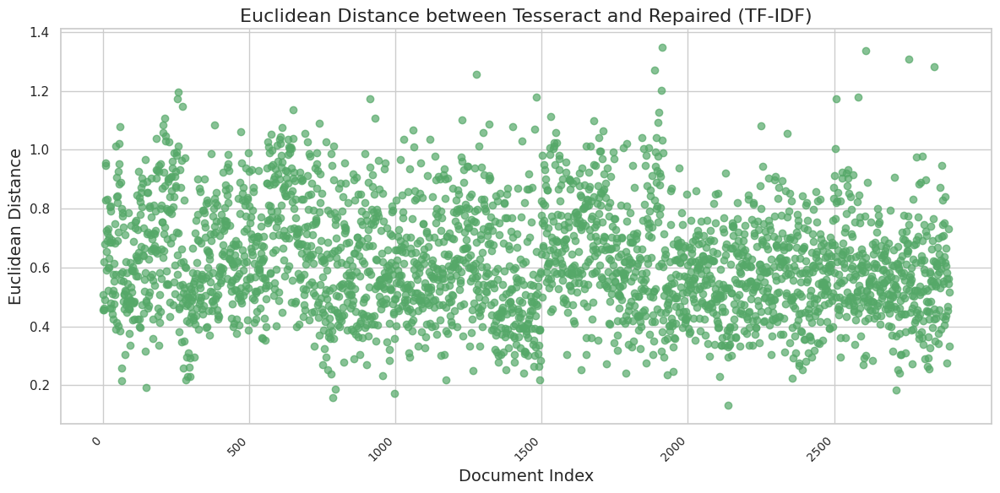

In [130]:
plt.figure(figsize=(12, 6))
plt.scatter(np.arange(len(df)), df['euclidean_distance'], color='g', alpha=0.7)
plt.title('Euclidean Distance between Tesseract and Repaired (TF-IDF)', fontsize=16)
plt.xlabel('Document Index', fontsize=14)
plt.ylabel('Euclidean Distance', fontsize=14)

# Adjust x-axis ticks to show every 500th document index
tick_interval = 500
plt.xticks(np.arange(0, len(df), step=tick_interval), df.index[::tick_interval], rotation=45, ha='right', fontsize=10)

plt.grid(True)
plt.tight_layout()
plt.show()


<ipython-input-131-535ecd6704b2>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(x=mean_scores.index, y=mean_scores.values, palette="viridis", alpha=0.85)


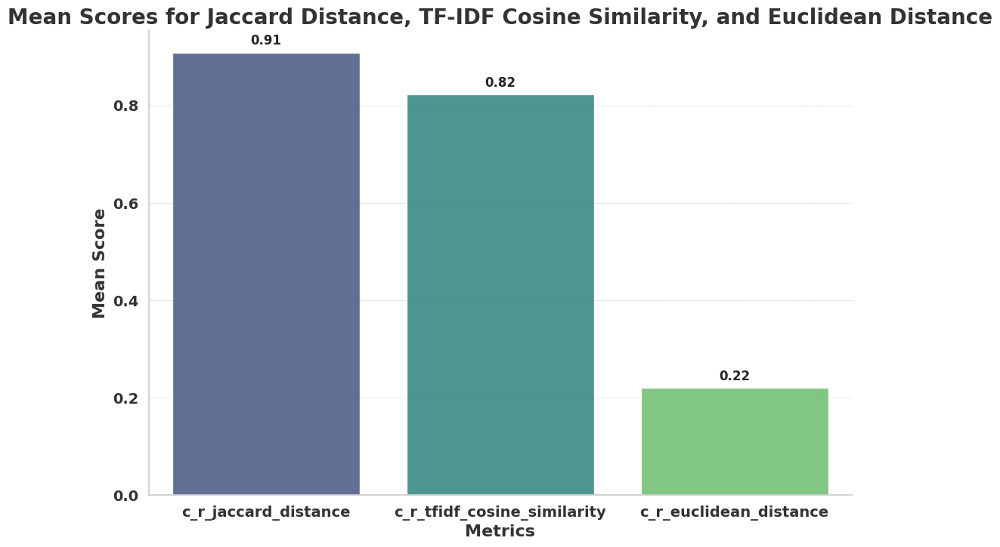

In [131]:
# Ensure seaborn styles are used
sns.set(style="whitegrid")

# Assuming `data` is your DataFrame with the relevant columns

# Calculate the mean scores
mean_scores = data[['c_r_jaccard_distance', 'c_r_tfidf_cosine_similarity', 'c_r_euclidean_distance']].mean()

# Set up the plot
plt.figure(figsize=(12, 8))
barplot = sns.barplot(x=mean_scores.index, y=mean_scores.values, palette="viridis", alpha=0.85)

# Add data labels on top of the bars
for index, value in enumerate(mean_scores):
    plt.text(index, value + 0.01, f'{value:.2f}', ha='center', va='bottom', fontsize=12, fontweight='bold')

# Set plot title and labels
plt.title('Mean Scores for Jaccard Distance, TF-IDF Cosine Similarity, and Euclidean Distance', fontsize=20, fontweight='bold', color='#333333')
plt.xlabel('Metrics', fontsize=16, fontweight='bold', color='#333333')
plt.ylabel('Mean Score', fontsize=16, fontweight='bold', color='#333333')

# Customize the axes and grid
plt.xticks(fontsize=14, fontweight='bold', color='#333333')
plt.yticks(fontsize=14, fontweight='bold', color='#333333')
plt.grid(axis='y', linestyle='--', linewidth=0.7, alpha=0.7)

# Remove the top and right spines for a cleaner look
sns.despine(top=True, right=True)

# Show the plot
plt.show()

### Semantic Similarity Between Repaired text and Cleaned Text

In [132]:
from scipy.spatial import distance

# Load Spacy model
nlp_spacy = spacy.load("en_core_web_md")

# Load Sentence Transformer model
model_st = SentenceTransformer('distilbert-base-nli-mean-tokens')

# Load TFHub Universal Sentence Encoder
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder/4")

# Function to compute Spacy similarity
def spacy_similarity(text1, text2):
    doc1 = nlp_spacy(text1)
    doc2 = nlp_spacy(text2)
    return doc1.similarity(doc2)

# Function to compute Sentence Transformers similarity
def st_similarity(text1, text2):
    embeddings = model_st.encode([text1, text2])
    return util.pytorch_cos_sim(embeddings[0], embeddings[1]).item()

# Function to compute Universal Sentence Encoder similarity
def use_similarity(text1, text2):
    embeddings = embed([text1, text2])
    return 1 - distance.cosine(embeddings[0], embeddings[1])



/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


In [115]:
data['tesseract'] = data['tesseract'].astype(str)
data['cleaned_text'] = data['cleaned_text'].astype(str)

# Compute similarities and create new columns
data['c_r_spacy_similarity'] = data.apply(lambda row: spacy_similarity(row['repaired_text'], row['cleaned_text']), axis=1)
data['c_r_st_similarity'] = data.apply(lambda row: st_similarity(row['repaired_text'], row['cleaned_text']), axis=1)
data['c_r_use_similarity'] = data.apply(lambda row: use_similarity(row['repaired_text'], row['cleaned_text']), axis=1)

# Display the DataFrame with new similarity columns
data

,Unnamed: 0.1,foi_documentId,index,Unnamed: 0,dc_publisher_name,dc_publisher,foi_requestDate,foi_decisionDate,dc_date_year,foi_pageNumber,...,euclidean_distance,sentiment,sentiment-RobbertBase,c_r_jaccard_distance,c_r_tfidf_cosine_similarity,t_r_tfidf_cosine_similarity,c_r_euclidean_distance,c_r_spacy_similarity,c_r_st_similarity,c_r_use_similarity
0,0,nl.mnre1010.2i.2020.21.misc.1,0,0,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-10-07,2020,1,...,0.457809,0,1,0.857988,0.929075,0.929075,2.035827e-01,0.997269,0.997722,0.997310
1,1,nl.mnre1010.2i.2020.22.misc.1,5,5,Ministerie van Algemene Zaken,mnre1010,2020-10-20,2020-11-16,2020,1,...,0.508457,0,1,0.940741,0.935623,0.935623,1.270838e-01,0.999692,0.998414,0.999386
2,2,nl.mnre1010.2i.2020.23.misc.1,7,7,Ministerie van Algemene Zaken,mnre1010,2020-10-21,2020-11-19,2020,1,...,0.619066,1,1,0.841270,0.857970,0.857970,3.666407e-01,0.998336,1.000000,0.996622
3,3,nl.mnre1010.2i.2020.25.misc.1,21,21,Ministerie van Algemene Zaken,mnre1010,2020-10-09,2020-11-23,2020,1,...,0.462752,0,1,0.928571,0.915746,0.915746,1.534893e-01,0.999431,1.000000,0.999064
4,4,nl.mnre1010.2i.2020.26.misc.1,23,23,Ministerie van Algemene Zaken,mnre1010,2020-03-26,2020-12-02,2020,1,...,0.456326,0,1,0.808140,0.919642,0.919642,2.906493e-01,0.995996,1.000000,0.996627
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2890,3548,nl.mnre1010.2i.2023.3.doc.1,74839,1115499,Ministerie Van Algemene Zaken,mnre1010,NaN,2023-03-20,2023,1,...,0.546503,0,1,0.915385,0.867665,0.867665,1.938299e-01,0.998548,0.996077,0.996791
2891,3549,nl.mnre1153.2i.2023.100.doc.1,74841,1115501,"Ministerie Van Landbouw, Natuur En Voedselkwal...",mnre1153,NaN,2023-03-21,2023,1,...,0.732386,1,1,0.970149,0.762720,0.762720,1.767376e-16,0.997310,0.992451,0.997680
2892,3550,nl.mnre1109.2i.2023.17.doc.1,74850,1116245,"Ministerie Van Onderwijs, Cultuur En Wetenschap",mnre1109,NaN,2023-03-28,2023,1,...,0.562303,0,1,0.887097,0.828541,0.828541,3.443128e-01,0.994224,0.995074,0.989622
2893,3551,nl.mnre1018.2i.2023.14.doc.1,74859,1116305,Ministerie Van Defensie,mnre1018,NaN,2023-03-28,2023,1,...,0.334013,0,1,0.888235,0.930773,0.930773,2.123717e-01,0.996124,1.000000,0.993762


<ipython-input-116-2342cb9ce095>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Similarity_Score', y='Similarity_Metric', data=data_melted, palette='viridis')


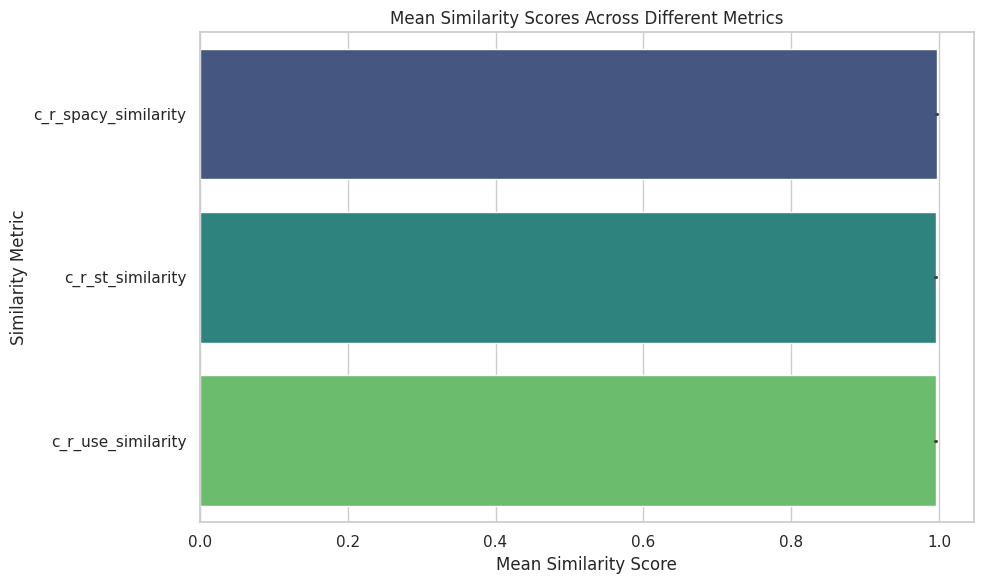

In [116]:
data_melted = data.melt(id_vars=['repaired_text', 'cleaned_text'],
                      value_vars=['c_r_spacy_similarity', 'c_r_st_similarity', 'c_r_use_similarity'],
                      var_name='Similarity_Metric',
                      value_name='Similarity_Score')

#Create a combined bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Similarity_Score', y='Similarity_Metric', data=data_melted, palette='viridis')
plt.xlabel('Mean Similarity Score')
plt.ylabel('Similarity Metric')
plt.title('Mean Similarity Scores Across Different Metrics')
plt.tight_layout()
plt.show()

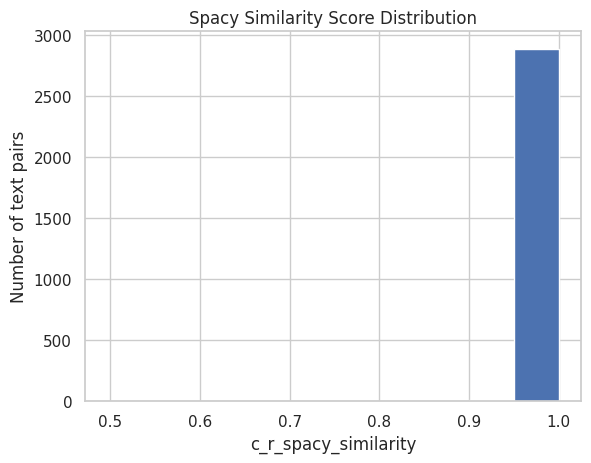

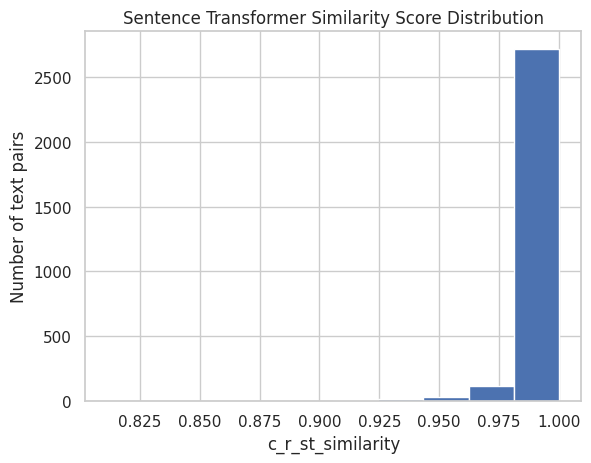

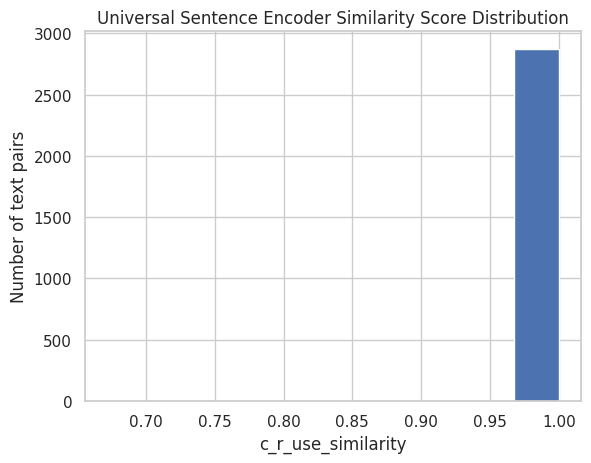


High Similarity Text Samples
DOI: nl.mnre1034.2i.2022.2.misc.1
Repaired_text: besluit op uw wobverzoek uw kenmerk bijlagen in uw brief van juli vraagt u op grond van de wet openbaarheid van bestuur hierna wob om stukken die ten grondslag liggen aan de keuze van het catshuisterrein als enige geschikte alternatief voor de tijdelijke vestiging van algemene zaken. de ontvangst van uw verzoek is schriftelijk bevestigd bij brief van juli . in de brief van augustus is de beslistermijn verdaagd met vier weken tot september . in die brief van september is de termijn voor beantwoording van uw verzoek opgeschort met vier weken in verband met het uitvragen van zienswijzen van derden. wettelijk kader uw verzoek valt onder de reikwijdte van de wob. voor de relevante wobartikelen verwijs ik u naar bijlage . besluit ik heb besloten deels aan uw verzoek tegemoet te komen en de informatie waarom u verzocht openbaar te maken. voor de motivering verwijs ik naar het onderdeel overwegingen van dit besluit.

In [133]:
# Function to plot distribution of similarity scores
def plot_distribution(data, col_name, title):
  plt.hist(data[col_name])
  plt.xlabel(col_name)
  plt.ylabel("Number of text pairs")
  plt.title(title)
  plt.grid(True)
  plt.show()

# Plot distribution for each method
plot_distribution(data, "c_r_spacy_similarity", "Spacy Similarity Score Distribution")
plot_distribution(data, "c_r_st_similarity", "Sentence Transformer Similarity Score Distribution")
plot_distribution(data, "c_r_use_similarity", "Universal Sentence Encoder Similarity Score Distribution")

# Sample high and low similarity pairs (adjust sample size as needed)
num_samples = 5

# Sort data by spacy similarity (replace with desired method for high/low sampling)
sorted_data = data.sort_values(by=["c_r_spacy_similarity"])

# High similarity samples
high_sim_samples = sorted_data.tail(num_samples)

# Low similarity samples
low_sim_samples = sorted_data.head(num_samples)

# Function to display sample text pairs
def show_text_samples(data, title):
  print(f"\n{title}")
  for idx, row in data.iterrows():
    print(f"DOI: {row['foi_documentId']}")
    print(f"Repaired_text: {row['repaired_text']}")
    print(f"Cleaned_text: {row['cleaned_text']}")
    print(f"Similarity Score: {row['c_r_spacy_similarity']}\n")  # Replace 'spacy_similarity' with desired method

# Display high similarity samples
show_text_samples(high_sim_samples, "High Similarity Text Samples")

# Display low similarity samples
show_text_samples(low_sim_samples, "Low Similarity Text Samples")


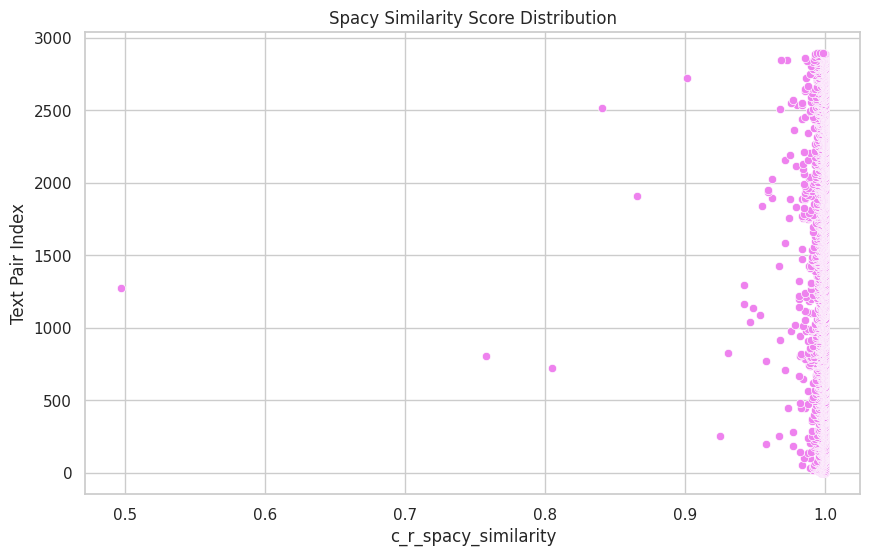

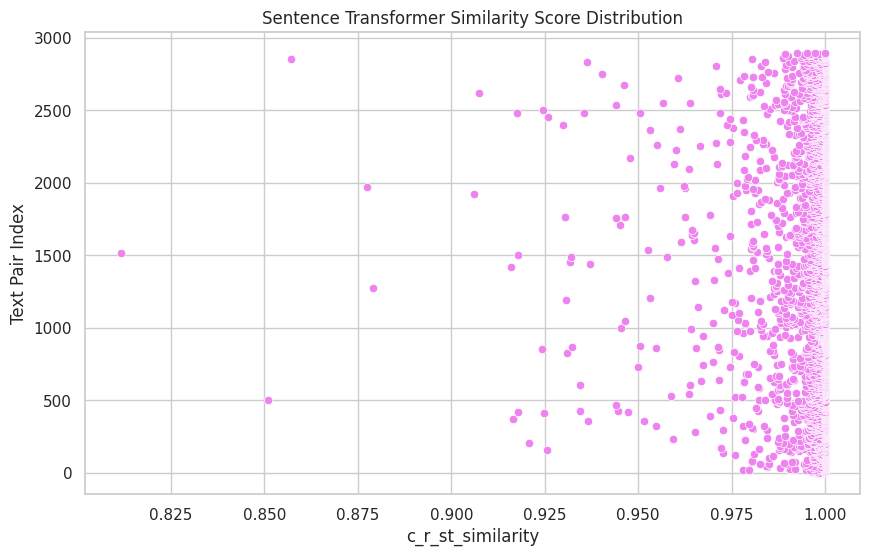

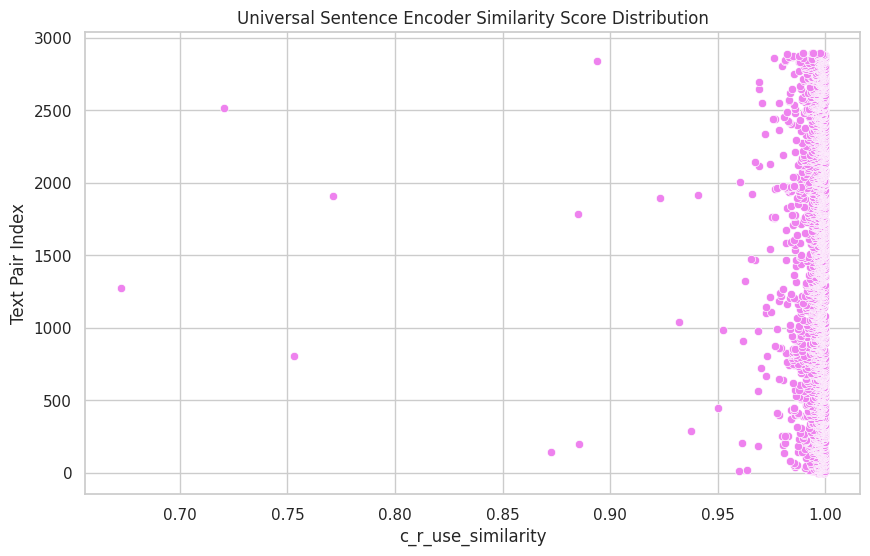

In [134]:
def plot_scatter(data, col_name, title):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=data, y=data.index, x=col_name, color='violet')
    plt.ylabel('Text Pair Index')
    plt.xlabel(col_name)
    plt.title(title)
    plt.grid(True)
    plt.show()

# Plot scatter plot for each method
plot_scatter(data, "c_r_spacy_similarity", "Spacy Similarity Score Distribution")
plot_scatter(data, "c_r_st_similarity", "Sentence Transformer Similarity Score Distribution")
plot_scatter(data, "c_r_use_similarity", "Universal Sentence Encoder Similarity Score Distribution")

<Figure size 1000x600 with 0 Axes>

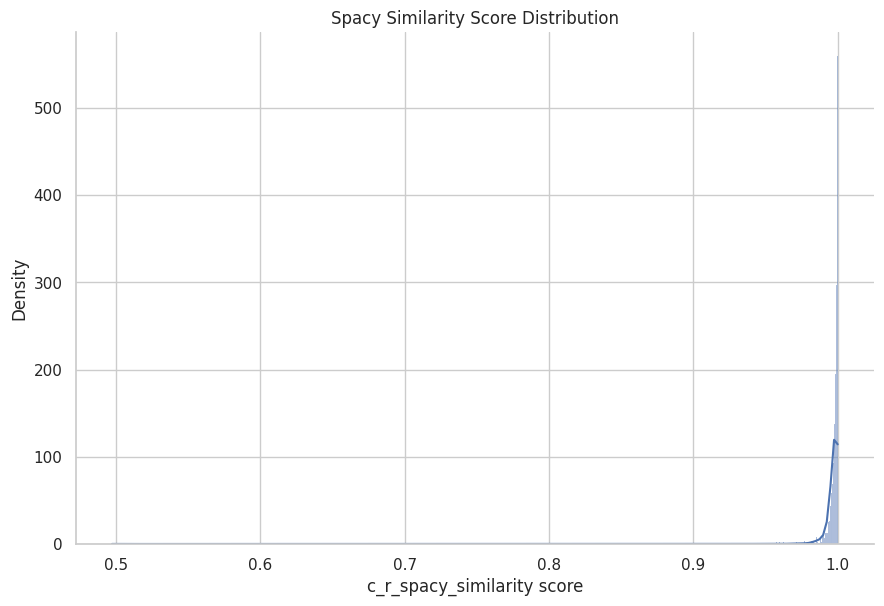

<Figure size 1000x600 with 0 Axes>

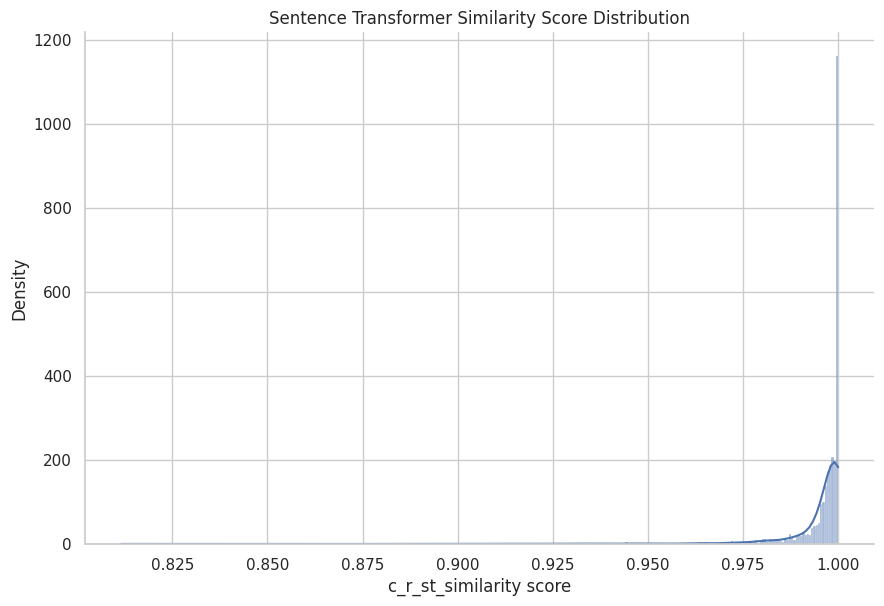

<Figure size 1000x600 with 0 Axes>

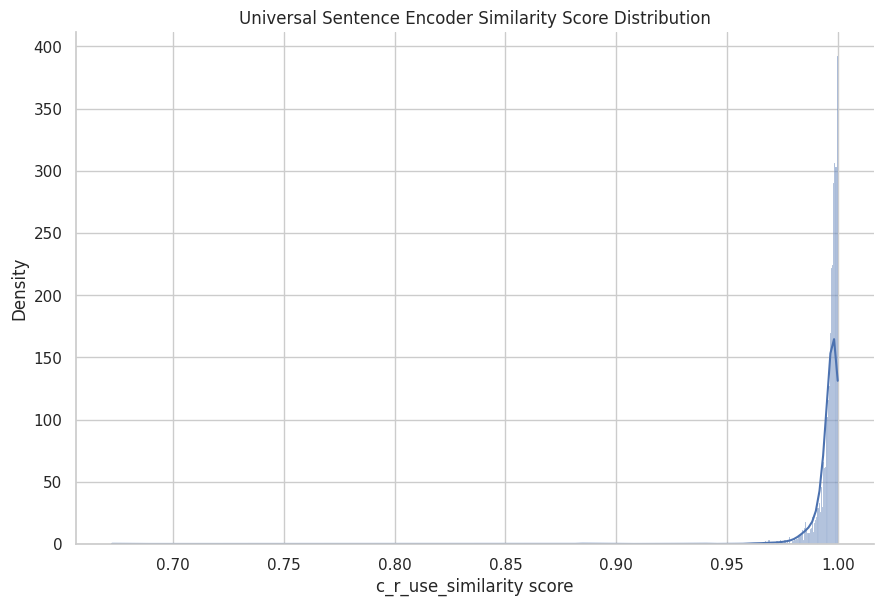

In [135]:
# Function to plot distribution of similarity scores with flipped axes
def plot_distribution(data, col_name, title):
    plt.figure(figsize=(10, 6))
    sns.displot(data=data, x=col_name, aspect=1.5, height=6, kde=True)
    plt.xlabel(col_name+" score")
    plt.ylabel('Density')
    plt.title(title)
    plt.grid(True)
    plt.show()

# Plot distribution for each method
plot_distribution(data, "c_r_spacy_similarity", "Spacy Similarity Score Distribution")
plot_distribution(data, "c_r_st_similarity", "Sentence Transformer Similarity Score Distribution")
plot_distribution(data, "c_r_use_similarity", "Universal Sentence Encoder Similarity Score Distribution")

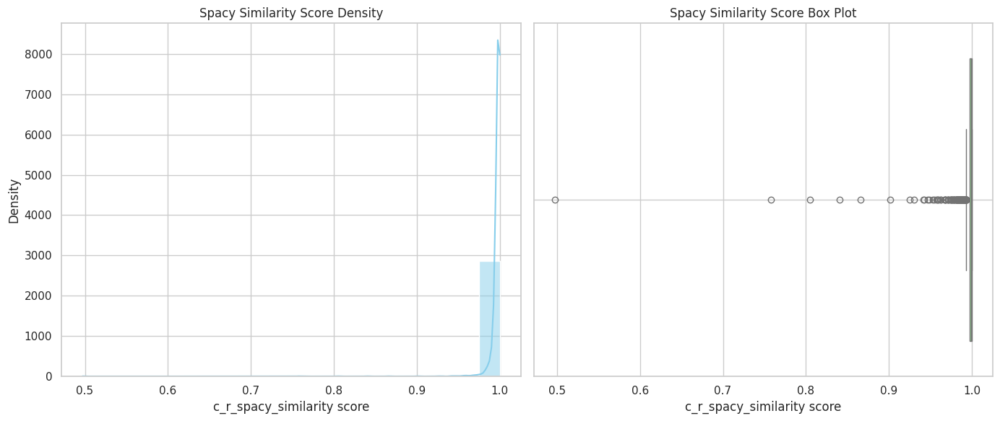

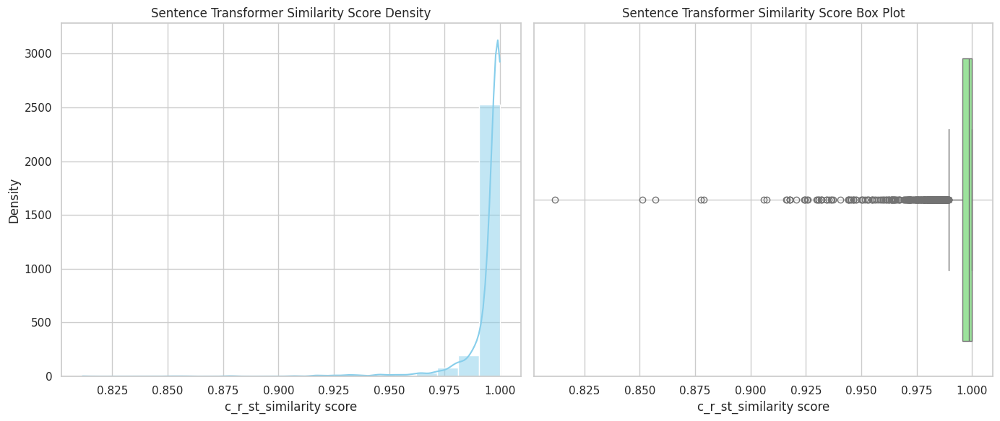

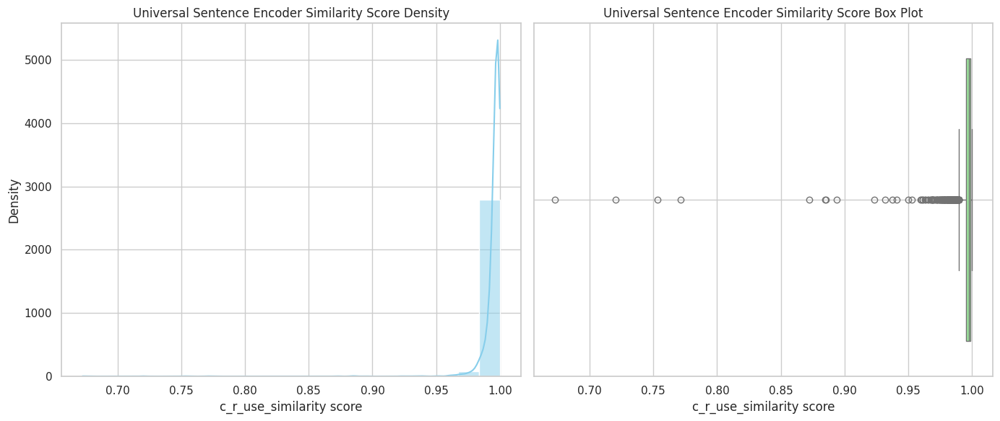

In [136]:
# Function to plot distribution of similarity scores with both density plot and box plot
def plot_distribution(data, col_name, title):
    plt.figure(figsize=(14, 6))

    # Plot density distribution
    plt.subplot(1, 2, 1)
    sns.histplot(data=data, x=col_name, kde=True, color='skyblue', bins=20)
    plt.xlabel(col_name + ' score')
    plt.ylabel('Density')
    plt.title(title + ' Density')
    plt.grid(True)

    # Plot box plot
    plt.subplot(1, 2, 2)
    sns.boxplot(data=data, x=col_name, color='lightgreen')
    plt.xlabel(col_name + ' score')
    plt.title(title + ' Box Plot')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Example usage with your column names and titles
plot_distribution(data, "c_r_spacy_similarity", "Spacy Similarity Score")
plot_distribution(data, "c_r_st_similarity", "Sentence Transformer Similarity Score")
plot_distribution(data, "c_r_use_similarity", "Universal Sentence Encoder Similarity Score")


### Human Evaluation Part

In [144]:
df = pd.read_csv("sample_30_human_evaluationutf8.csv")

In [145]:
df

,Index,URL,DOI,OCR tekst,HUMAN tekst vanaf BETREFT,CLEANED TEKST,Repaired tekst
0,1.0,https://pid.wooverheid.nl/?pid=nl.mnre1045.2i....,nl.mnre1045.2i.2022.71.misc.1,en Klimaat > Retouradres Postbus 2...,Woo-besluit Tata Steel\n\nGeachte \n\nIn uw v...,woobesluit tata steel geachte . . in uw verzoe...,woobesluit tata steel geachte . . in uw verzoe...
1,2.0,https://pid.wooverheid.nl/nl.mnre1034.2i.2021....,nl.mnre1034.2i.2021.4.misc.1,Rijksvastgoedbedrijf Ministerie van Binnenlan...,Wob-besluit inzake Oranjehotel\n\n\nIn uw e-ma...,wobbesluit inzake oranjehotel in uw email van ...,wob-besluit inzake oranjehotel in uw e-mail va...
2,3.0,https://open.overheid.nl/documenten/ronl-61b01...,nl.mnre1109.2i.2020.40.misc.1,"Ministerie van Onderwijs, Cultuur en ...","Besluit Wob-verzoek\n\nGeachte , \n\nBij brief...",besluit wobverzoek bezwaar als u belang hebt b...,besluit wobverzoek bezwaar als u belang hebt b...
3,4.0,https://open.overheid.nl/documenten/ronl-b28f0...,nl.mnre1153.2i.2022.70.misc.1,"Ministerie van Landbouw, SOR Natuur en Voedse...",Besluit bij wob-verzoek d.d. 9 maart 2022 inza...,besluit bij wobverzoek d.d. maart inzake het a...,besluit bij wobverzoek d.d.maart inzake het an...
4,5.0,https://pid.wooverheid.nl/?pid=nl.mnre1058.2i....,nl.mnre1045.2i.2023.15.besluit.1,en Klimaat > Retouradres Postbus 2...,Besluit op Woo-verzoek inzake de aanpassing va...,besluit op wooverzoek inzake de aanpassing van...,besluit op uw verzoek inzake de aanpassing van...
5,6.0,https://open.overheid.nl/documenten/ronl-a6f3d...,nl.mnre1153.2i.2021.122.misc.1,ada $ cM Ministerie va...,Besluit op uw Wob-verzoek van 10 april 2021\n\...,besluit op uw wobverzoek van april geachte a i...,besluit op uw wobverzoek van april geachte a i...
6,7.0,https://open.overheid.nl/documenten/ronl-b5092...,nl.mnre1045.2i.2019.5.misc.1,odd Ministerie van Economische Zak...,Deelbesluit 1 Wob-verzoek inzake klimaatakkoor...,deelbesluit i wobverzoek inzake klimaatakkoord...,deelbesluit i wob-verzoek inzake klimaatakkoor...
7,8.0,https://open.overheid.nl/documenten/ronl-f892e...,nl.mnre1045.2i.2022.47.misc.1,Agentschap Telecom Ministerie van Economi...,Beslissing op Woo-verzoek\n\nGeachte\n\nOp 30 ...,beslissing op wooverzoek geachte op mei heb ik...,beslissing op wooverzoek geachte op mei heb ik...
8,9.0,NaN,nl.mnre1025.2i.2022.17.misc.1,Welzijn en Sport > Retouradres Pos...,Beslissing op uw bezwaar\n\nGeachte \n\nHierbi...,hierbij ontvangt u de beslissing op het bezwaa...,hierbij ontvangt u de beslissing op het bezwaa...
9,10.0,https://open.overheid.nl/documenten/ronl-8c5ae...,nl.mnre1153.2i.2021.83.misc.1,“2m Rijksdienst voor Ondernemend AA Neder...,Besluit op uw Wob-verzoek\n\nGeachte\n\nIn uw ...,besluit op uw wobverzoek wob geachte in uw bri...,besluit op uw Wob-verzoek Wob geachte in uw br...


In [146]:
# Drop the rows where 'repaired_text' column has NaN values
df = df.dropna(subset=['HUMAN tekst vanaf BETREFT'])

In [ ]:
#Semantic Similarity

In [147]:
df['HUMAN tekst vanaf BETREFT'] = df['HUMAN tekst vanaf BETREFT'].astype(str)
df['CLEANED TEKST'] = df['CLEANED TEKST'].astype(str)

# Fill NaN values with an empty string
df['HUMAN tekst vanaf BETREFT'] = df['HUMAN tekst vanaf BETREFT'].astype(str).fillna('')
df['CLEANED TEKST'] = df['CLEANED TEKST'].astype(str).fillna('')

# Compute similarities and create new columns
df['spacy_similarity'] = df.apply(lambda row: spacy_similarity(row['HUMAN tekst vanaf BETREFT'], row['CLEANED TEKST']), axis=1)
df['st_similarity'] = df.apply(lambda row: st_similarity(row['HUMAN tekst vanaf BETREFT'], row['CLEANED TEKST']), axis=1)
df['use_similarity'] = df.apply(lambda row: use_similarity(row['HUMAN tekst vanaf BETREFT'], row['CLEANED TEKST']), axis=1)

# Display the DataFrame with new similarity columns
df

<ipython-input-147-58cd5ba96476>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['HUMAN tekst vanaf BETREFT'] = df['HUMAN tekst vanaf BETREFT'].astype(str)
<ipython-input-147-58cd5ba96476>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['CLEANED TEKST'] = df['CLEANED TEKST'].astype(str)
<ipython-input-147-58cd5ba96476>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the document

,Index,URL,DOI,OCR tekst,HUMAN tekst vanaf BETREFT,CLEANED TEKST,Repaired tekst,spacy_similarity,st_similarity,use_similarity
0,1.0,https://pid.wooverheid.nl/?pid=nl.mnre1045.2i....,nl.mnre1045.2i.2022.71.misc.1,en Klimaat > Retouradres Postbus 2...,Woo-besluit Tata Steel\n\nGeachte \n\nIn uw v...,woobesluit tata steel geachte . . in uw verzoe...,woobesluit tata steel geachte . . in uw verzoe...,0.930811,0.842509,0.981170
1,2.0,https://pid.wooverheid.nl/nl.mnre1034.2i.2021....,nl.mnre1034.2i.2021.4.misc.1,Rijksvastgoedbedrijf Ministerie van Binnenlan...,Wob-besluit inzake Oranjehotel\n\n\nIn uw e-ma...,wobbesluit inzake oranjehotel in uw email van ...,wob-besluit inzake oranjehotel in uw e-mail va...,0.930587,0.808650,0.954746
2,3.0,https://open.overheid.nl/documenten/ronl-61b01...,nl.mnre1109.2i.2020.40.misc.1,"Ministerie van Onderwijs, Cultuur en ...","Besluit Wob-verzoek\n\nGeachte , \n\nBij brief...",besluit wobverzoek bezwaar als u belang hebt b...,besluit wobverzoek bezwaar als u belang hebt b...,0.903696,0.764307,0.924085
3,4.0,https://open.overheid.nl/documenten/ronl-b28f0...,nl.mnre1153.2i.2022.70.misc.1,"Ministerie van Landbouw, SOR Natuur en Voedse...",Besluit bij wob-verzoek d.d. 9 maart 2022 inza...,besluit bij wobverzoek d.d. maart inzake het a...,besluit bij wobverzoek d.d.maart inzake het an...,0.891377,0.797373,0.978498
4,5.0,https://pid.wooverheid.nl/?pid=nl.mnre1058.2i....,nl.mnre1045.2i.2023.15.besluit.1,en Klimaat > Retouradres Postbus 2...,Besluit op Woo-verzoek inzake de aanpassing va...,besluit op wooverzoek inzake de aanpassing van...,besluit op uw verzoek inzake de aanpassing van...,0.970692,0.823288,0.964676
5,6.0,https://open.overheid.nl/documenten/ronl-a6f3d...,nl.mnre1153.2i.2021.122.misc.1,ada $ cM Ministerie va...,Besluit op uw Wob-verzoek van 10 april 2021\n\...,besluit op uw wobverzoek van april geachte a i...,besluit op uw wobverzoek van april geachte a i...,0.973440,0.696572,0.973253
6,7.0,https://open.overheid.nl/documenten/ronl-b5092...,nl.mnre1045.2i.2019.5.misc.1,odd Ministerie van Economische Zak...,Deelbesluit 1 Wob-verzoek inzake klimaatakkoor...,deelbesluit i wobverzoek inzake klimaatakkoord...,deelbesluit i wob-verzoek inzake klimaatakkoor...,0.895876,0.863252,0.964473
7,8.0,https://open.overheid.nl/documenten/ronl-f892e...,nl.mnre1045.2i.2022.47.misc.1,Agentschap Telecom Ministerie van Economi...,Beslissing op Woo-verzoek\n\nGeachte\n\nOp 30 ...,beslissing op wooverzoek geachte op mei heb ik...,beslissing op wooverzoek geachte op mei heb ik...,0.957532,0.770671,0.969526
8,9.0,NaN,nl.mnre1025.2i.2022.17.misc.1,Welzijn en Sport > Retouradres Pos...,Beslissing op uw bezwaar\n\nGeachte \n\nHierbi...,hierbij ontvangt u de beslissing op het bezwaa...,hierbij ontvangt u de beslissing op het bezwaa...,0.973502,0.858145,0.973373
9,10.0,https://open.overheid.nl/documenten/ronl-8c5ae...,nl.mnre1153.2i.2021.83.misc.1,“2m Rijksdienst voor Ondernemend AA Neder...,Besluit op uw Wob-verzoek\n\nGeachte\n\nIn uw ...,besluit op uw wobverzoek wob geachte in uw bri...,besluit op uw Wob-verzoek Wob geachte in uw br...,0.948204,0.850448,0.966337


<ipython-input-148-8803b719cc12>:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Similarity_Score', y='Similarity_Metric', data=df_melted, palette='viridis')


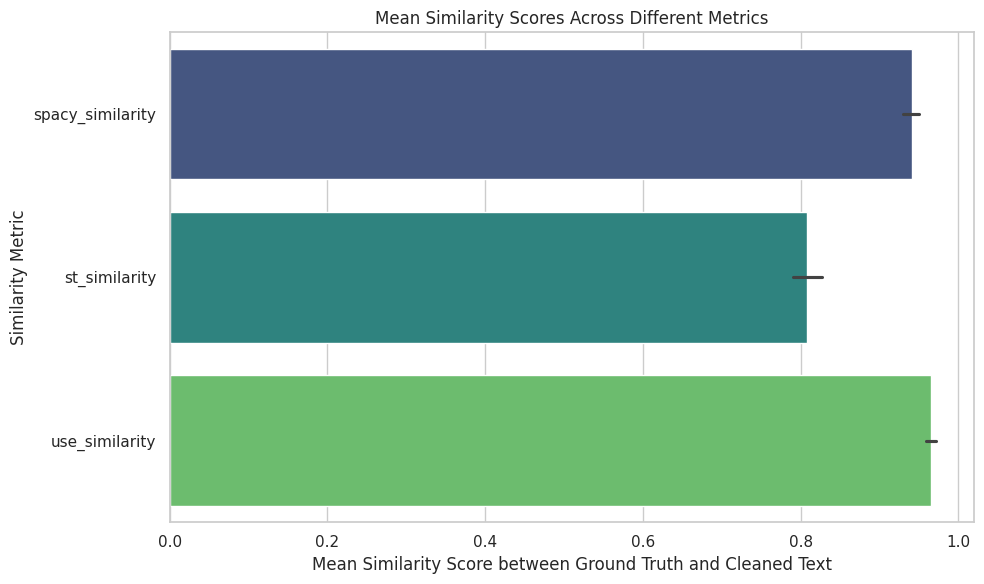

In [148]:
df_melted = df.melt(id_vars=['HUMAN tekst vanaf BETREFT', 'CLEANED TEKST'],
                      value_vars=['spacy_similarity', 'st_similarity', 'use_similarity'],
                      var_name='Similarity_Metric',
                      value_name='Similarity_Score')

# Create a combined bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Similarity_Score', y='Similarity_Metric', data=df_melted, palette='viridis')
plt.xlabel('Mean Similarity Score between Ground Truth and Cleaned Text')
plt.ylabel('Similarity Metric')
plt.title('Mean Similarity Scores Across Different Metrics')
plt.tight_layout()
plt.show()

<Figure size 1000x600 with 0 Axes>

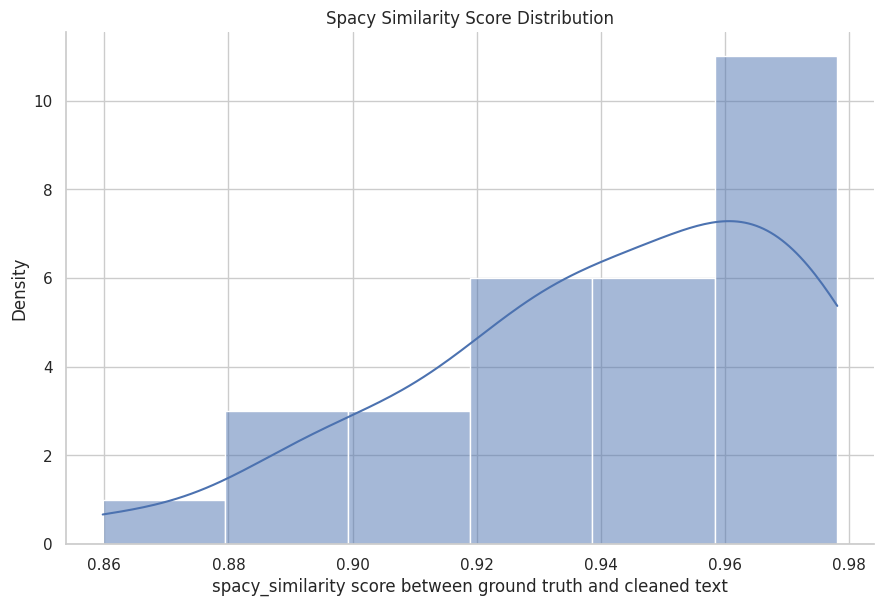

<Figure size 1000x600 with 0 Axes>

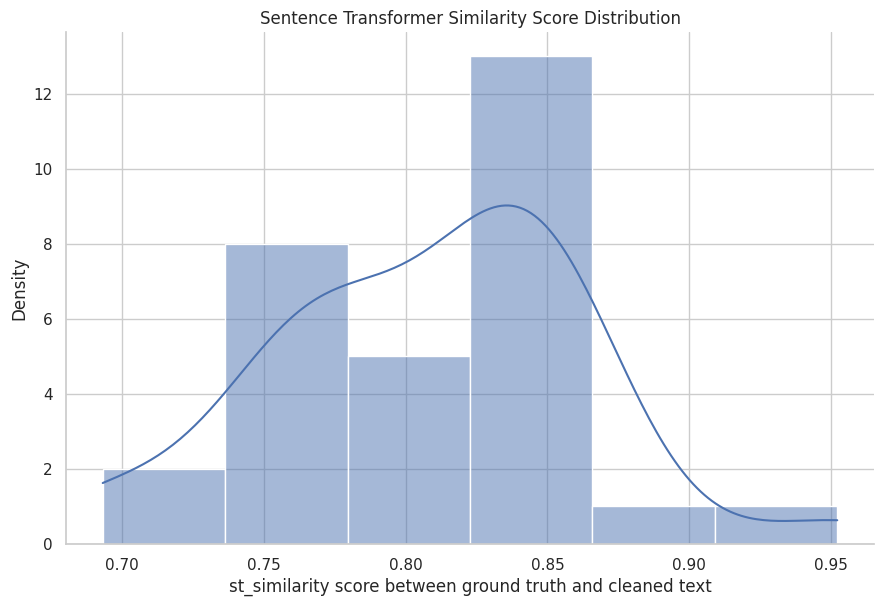

<Figure size 1000x600 with 0 Axes>

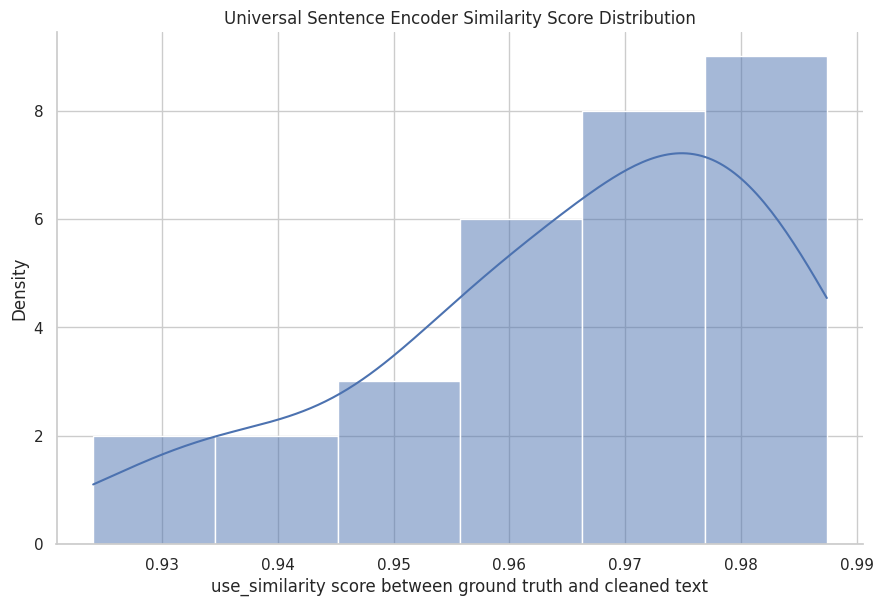

In [149]:
# Function to plot distribution of similarity scores with flipped axes
def plot_distribution(data, col_name, title):
    plt.figure(figsize=(10, 6))
    sns.displot(data=data, x=col_name, aspect=1.5, height=6, kde=True)
    plt.xlabel(col_name+" score between ground truth and cleaned text") #to consider the similarity between the text extracted by OCR and the actual text
    plt.ylabel('Density')
    plt.title(title)
    plt.grid(True)
    plt.show()

# Plot distribution for each method
plot_distribution(df, "spacy_similarity", "Spacy Similarity Score Distribution")
plot_distribution(df, "st_similarity", "Sentence Transformer Similarity Score Distribution")
plot_distribution(df, "use_similarity", "Universal Sentence Encoder Similarity Score Distribution")

In [150]:
# Function to calculate Levenshtein distance, handling NaN values
def calculate_levenshtein(row):
    human_text = str(row['HUMAN tekst vanaf BETREFT'])  # Convert to string to handle NaN gracefully
    cleaned_text = str(row['CLEANED TEKST'])  # Convert to string to handle NaN gracefully
    return lev_distance(human_text, cleaned_text)

In [151]:
# Apply the function to each row in the DataFrame
df['levenshtein_distance_eval'] = df.apply(calculate_levenshtein, axis=1)

<ipython-input-151-fdccc315af8a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['levenshtein_distance_eval'] = df.apply(calculate_levenshtein, axis=1)


In [152]:
df

,Index,URL,DOI,OCR tekst,HUMAN tekst vanaf BETREFT,CLEANED TEKST,Repaired tekst,spacy_similarity,st_similarity,use_similarity,levenshtein_distance_eval
0,1.0,https://pid.wooverheid.nl/?pid=nl.mnre1045.2i....,nl.mnre1045.2i.2022.71.misc.1,en Klimaat > Retouradres Postbus 2...,Woo-besluit Tata Steel\n\nGeachte \n\nIn uw v...,woobesluit tata steel geachte . . in uw verzoe...,woobesluit tata steel geachte . . in uw verzoe...,0.930811,0.842509,0.981170,316
1,2.0,https://pid.wooverheid.nl/nl.mnre1034.2i.2021....,nl.mnre1034.2i.2021.4.misc.1,Rijksvastgoedbedrijf Ministerie van Binnenlan...,Wob-besluit inzake Oranjehotel\n\n\nIn uw e-ma...,wobbesluit inzake oranjehotel in uw email van ...,wob-besluit inzake oranjehotel in uw e-mail va...,0.930587,0.808650,0.954746,240
2,3.0,https://open.overheid.nl/documenten/ronl-61b01...,nl.mnre1109.2i.2020.40.misc.1,"Ministerie van Onderwijs, Cultuur en ...","Besluit Wob-verzoek\n\nGeachte , \n\nBij brief...",besluit wobverzoek bezwaar als u belang hebt b...,besluit wobverzoek bezwaar als u belang hebt b...,0.903696,0.764307,0.924085,402
3,4.0,https://open.overheid.nl/documenten/ronl-b28f0...,nl.mnre1153.2i.2022.70.misc.1,"Ministerie van Landbouw, SOR Natuur en Voedse...",Besluit bij wob-verzoek d.d. 9 maart 2022 inza...,besluit bij wobverzoek d.d. maart inzake het a...,besluit bij wobverzoek d.d.maart inzake het an...,0.891377,0.797373,0.978498,625
4,5.0,https://pid.wooverheid.nl/?pid=nl.mnre1058.2i....,nl.mnre1045.2i.2023.15.besluit.1,en Klimaat > Retouradres Postbus 2...,Besluit op Woo-verzoek inzake de aanpassing va...,besluit op wooverzoek inzake de aanpassing van...,besluit op uw verzoek inzake de aanpassing van...,0.970692,0.823288,0.964676,434
5,6.0,https://open.overheid.nl/documenten/ronl-a6f3d...,nl.mnre1153.2i.2021.122.misc.1,ada $ cM Ministerie va...,Besluit op uw Wob-verzoek van 10 april 2021\n\...,besluit op uw wobverzoek van april geachte a i...,besluit op uw wobverzoek van april geachte a i...,0.973440,0.696572,0.973253,332
6,7.0,https://open.overheid.nl/documenten/ronl-b5092...,nl.mnre1045.2i.2019.5.misc.1,odd Ministerie van Economische Zak...,Deelbesluit 1 Wob-verzoek inzake klimaatakkoor...,deelbesluit i wobverzoek inzake klimaatakkoord...,deelbesluit i wob-verzoek inzake klimaatakkoor...,0.895876,0.863252,0.964473,591
7,8.0,https://open.overheid.nl/documenten/ronl-f892e...,nl.mnre1045.2i.2022.47.misc.1,Agentschap Telecom Ministerie van Economi...,Beslissing op Woo-verzoek\n\nGeachte\n\nOp 30 ...,beslissing op wooverzoek geachte op mei heb ik...,beslissing op wooverzoek geachte op mei heb ik...,0.957532,0.770671,0.969526,151
8,9.0,NaN,nl.mnre1025.2i.2022.17.misc.1,Welzijn en Sport > Retouradres Pos...,Beslissing op uw bezwaar\n\nGeachte \n\nHierbi...,hierbij ontvangt u de beslissing op het bezwaa...,hierbij ontvangt u de beslissing op het bezwaa...,0.973502,0.858145,0.973373,533
9,10.0,https://open.overheid.nl/documenten/ronl-8c5ae...,nl.mnre1153.2i.2021.83.misc.1,“2m Rijksdienst voor Ondernemend AA Neder...,Besluit op uw Wob-verzoek\n\nGeachte\n\nIn uw ...,besluit op uw wobverzoek wob geachte in uw bri...,besluit op uw Wob-verzoek Wob geachte in uw br...,0.948204,0.850448,0.966337,110


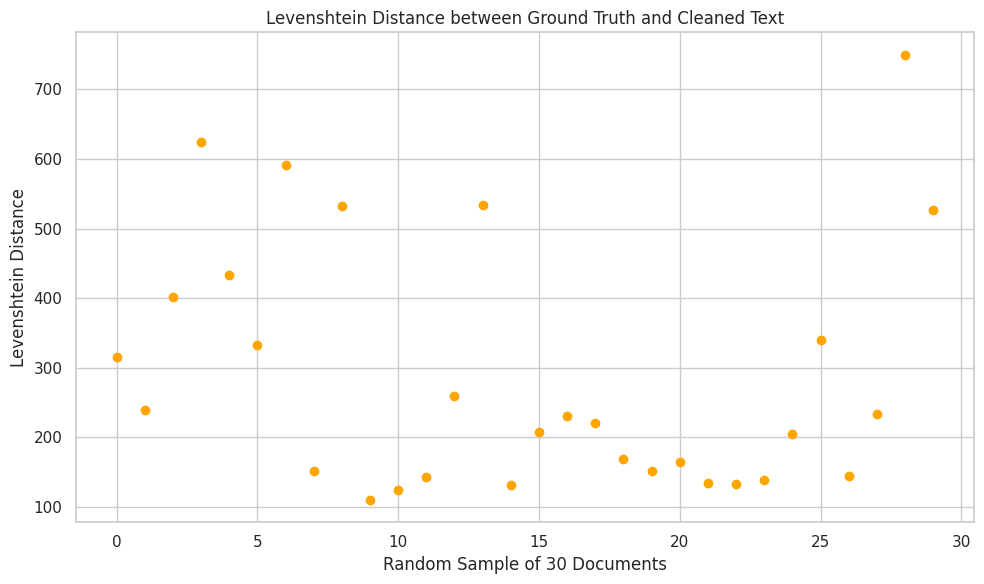

In [154]:
document_index_column = 'index'
levenshtein_distance_column = 'levenshtein_distance_eval'

plt.figure(figsize=(10, 6))
plt.scatter(range(len(df)), df[levenshtein_distance_column], color='orange')
plt.title('Levenshtein Distance between Ground Truth and Cleaned Text')
plt.xlabel('Random Sample of 30 Documents')
plt.ylabel('Levenshtein Distance')

plt.grid(True)
plt.tight_layout()
plt.show()

### Sample 30 rows randomly from the dataset

In [157]:
# Sample 30 random doi's to consider for the human evaluation
sampled_df = data.sample(n=30, random_state=1)

# Save the sampled DataFrame to a new CSV file
sampled_df.to_csv('sample_30_human_evaluationutf8.csv', index=False)


### Use this to return the row and relevant data using the DOI